<header>
<h1><center>Exploratory Data Analysis of the<br>2020 Kaggle Machine Learning & Data Science Survey</center></h1>
<h5><center>Focused on the distributions for India vis-a-vis USA and Data Scientist vis-a-vis General trends</center></h5>
</header>

The data is for an industry-wide survey that presents a truly comprehensive view of the state of data science and machine learning and has 20,036 repondants from all over the world.<br>

**The challenge objective**: tell a data story about a subset of the data science community represented in this survey, through a combination of both narrative text and data exploration.

**Survey structure**: 39+ questions and 20,036 responses.<br>Responses to multiple choice questions (only a single choice can be selected) were recorded in individual columns. Responses to multiple selection questions (multiple choices can be selected) were split into multiple columns (with one column per answer choice).

<a href="https://www.kaggle.com/c/kaggle-survey-2020">Link to competition page</a>

<a id="toc"></a>
## Table of Contents
1. [Prerequisites](#1.-Prerequisites)
2. [Defined functions](#Defined-functions)
3. [Import data](#2.-Import-data)
4. [Questions in the survey](#3.-Questions-in-the-survey)
5. [Data preprocessing](#4.-Data-preprocessing)
6. [Question analysis](#5.-Question-analysis)
    - [Q1 - Age](#Q1---Age)
    - [Q2 - Gender](#Q2---Gender)
      - [Observations](#obs-q2.1)
      - [Gender-Age Distribution](#Gender-Age-Distribution)
        - [Observations](#obs-q1q2)
    - [Q3 - Country of residence](#Q3---Country-of-residence)
      - [Observations](#obs-q3.1)
      - [Region-wise frequency distribution](#Region-wise-frequency-distribution)
        - [Observations](#obs-q3.2)
    - [Q4 - Education](#Q4---Education)
      - [Observations](#obs-q4)
    - [Q5 - Job role](#Q5---Job-role)
      - [Observations](#obs-q5)
    - [Q6 - Programming experience](#Q6---Programming-experience)
      - [Observations](#obs-q6)
    - [Q4 & Q5 - Education & Job role](#Q4-&-Q5---Education-&-Job-role)
      - [a) Heatmap](#a%29-Heatmap)
      - [b) Stacked Bar Chart](#b%29-Stacked-Bar-Chart)
      - [c) Comparitive bar chart](#c%29-Comparitive-bar-chart)
      - [Observations](#obs-q4q5)
    - [Q4 & Q6 - Education & Coding experience](#Q4-&-Q6---Education-&-Coding-experience)
      - [Observations](#obs-q4q6)
    - [Q5 & Q6 - Job role and Coding experience](#Q5-&-Q6---Job-role-and-Coding-experience)
      - [Observations](#obs-q5q6)
    - [Q7 - Regularly used programming language](#Q7---Regularly-used-programming-language)
      - [Observations](#obs-q7)
    - [Q5 & Q7 - Role & Language](#Q5-&-Q7---Role-&-Language)
      - [Observations](#obs-q5q7)
    - [Q8 - Recommended Language](#Q8---Recommended-Language)
      - [Observations](#obs-q8)
    - [Q9 - IDE Used](#Q9---IDE-Used)
      - [Observations](#obs-q9)
    - [Q10 - Hosted notebook products regularly used](#Q10---Hosted-notebook-products-regularly-used)
      - [Observations](#obs-q10)
    - [Q11 - Computing platform](#Q11---Computing-platform)
      - [Observations](#obs-q11)
    - [Q12 - Specialized hardware](#Q12---Specialized-hardware)
    - [Q13 - TPU usage in life](#Q13---TPU-usage-in-life)
    - [Q14 - Visualization libraries](#Q14---Visualization-libraries)
      - [Observations](#obs-q14)
    - [Q15 - Machine Learning Methods](#Q15---Machine-Learning-Methods)
      - [Observations](#obs-q15)
    - [Q16 - Machine Learning Frameworks](#Q16---Machine-Learning-Frameworks)
      - [Observations](#obs-q16)
    - [Q17 - ML Algorithms](#Q17---ML-Algorithms)
    - [Q18 - Computer Vision Methods](#Q18---Computer-Vision-Methods)
      - [Observations](#obs-q18)
    - [Q19 - Natural Language Processing](#Q19---Natural-Language-Processing)
    - [Q20 - Company size](#Q20---Company-size)
    - [Q21 - Individuals engaged in Data Science work at workplace](#Q21---Individuals-engaged-in-Data-Science-work-at-workplace)
      - [Observations](#obs-q21)
    - [Q22 - ML methods used in business](#Q22---ML-methods-used-in-business)
      - [Observations](#obs-q22)
    - [Q23 - Important work activities](#Q23---Important-work-activities)
    - [Q24 - Yearly Compensation](#Q24---Yearly-Compensation)
    - [Q25 - Money spent on ML / Cloud-computing](#Q25---Money-spent-on-ML-/-Cloud-computing)
    - [Q26 - Cloud-computing platform](#Q26---Cloud-computing-platform)
    - [Q27 - Cloud-computing products](#Q27---Cloud-computing-products)
    - [Q28 - Machine learning products](#Q28---Machine-learning-products)
    - [Q29 - Big Data Products](#Q29---Big-Data-Products)
    - [Q30 - Most used big data products](#Q30---Most-used-big-data-products)
    - [Q31 - Business Intelligence Tools](#Q31---Business-Intelligence-Tools)
    - [Q32 - Business Intilligence tools used most often](#Q32---Business-Intilligence-tools-used-most-often)
    - [Q33 - Automated ML Tools Category](#Q33---Automated-ML-Tools-Category)
    - [Q34 - Automated ML tools](#Q34---Automated-ML-tools)
    - [Q35 - ML experiments](#Q35---ML-experiments)
    - [Q36 - Public sharing platforms](#Q36---Public-sharing-platforms)
    - [Q37 - DS learning platforms](#Q37---DS-learning-platforms)
    - [Q38 - Data Analysis Tool](#Q38---Data-Analysis-Tool)
    - [Q39 - Favorite Media Sources](#Q39---Favorite-Media-Sources)

7. [Notes](#Notes)
8. [References](#Notebooks-Referenced)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 1. Prerequisites

In [1]:
# Libraries
import os
import numpy as np
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import init_notebook_mode
import plotly.figure_factory as ff
from plotly import subplots
init_notebook_mode(connected=True)
%matplotlib inline
from textwrap import fill, wrap
import re

plt.rcParams['figure.dpi'] = 150 # higher resolution

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Defined functions

In [2]:
# Function to forestall UserWarning
import warnings
def fxn():
    warnings.warn("UserWarning arose", UserWarning)

In [3]:
# Function to create distribution of a variable based on 2 conditions
def fd(data, data1=None, criteria1=None, data2=None, criteria2=None, title='criteria', 
       strip=False, contains=False, otherthan1=False, otherthan2=False):
    """Create distribution of a variable based on 2 conditions.(order is important)"""
    tempdf1 = data.copy()
    if data1 is not None:
        if isinstance(data1, pd.Series):
            cdf1 = data1.copy().to_frame()
        else:
            cdf1 = data1.copy()
    else:
        cdf1 = None
            
    if data2 is not None:
        if isinstance(data2, pd.Series):
            cdf2 = data2.copy().to_frame()
        else:
            cdf2 = data2.copy()
    else:
        cdf2 = None
    
    if len(data.shape) > 1:
        if data.shape[1] > 1:
            tempdf1.columns = tempdf1.mode().values.tolist()[0]
    if strip==True:
        for df in [cdf1, cdf2]:
            if df is not None:
                for c in df:
                    df[c] = df[c].apply(lambda x: x.strip() if isinstance(x, str) else x)

    
    if ((criteria1==None) & (criteria2==None)):
        tempdf = tempdf1.copy()
        case = 1
    elif criteria1==None:
        tempdf = pd.concat([cdf2, tempdf1], axis=1)
        case = 2
    elif criteria2==None:
        tempdf = pd.concat([cdf1, tempdf1], axis=1)
        case = 2
    else:
        tempdf = pd.concat([cdf1, cdf2, tempdf1], axis=1)
        case = 3
        
    if case == 3:
        if ((otherthan1 is True) and (otherthan2 is True)):
            if contains==True:
                tempdf = tempdf[~(tempdf.iloc[:,0].str.contains(r''+criteria1, regex=True, na=False)) &
                            ~(tempdf.iloc[:,1].str.contains(r''+criteria2, regex=True, na=False))]
            else:
                tempdf = tempdf[(tempdf.iloc[:,0] != criteria1) & (tempdf.iloc[:,1] != criteria2)]
        else:
            if contains==True:
                tempdf = tempdf[(tempdf.iloc[:,0].str.contains(r''+criteria1, regex=True, na=False)) &
                            (tempdf.iloc[:,1].str.contains(r''+criteria2, regex=True, na=False))]
            else:
                tempdf = tempdf[(tempdf.iloc[:,0] == criteria1) & (tempdf.iloc[:,1] == criteria2)]
        tempdf.drop(tempdf.columns[[0,1]], axis=1, inplace=True)
            

    if case == 2:
        crit = criteria2 if criteria1==None else criteria1
        otherthan = otherthan2 if criteria1==None else otherthan1
        if otherthan:
            if contains==True:
                tempdf = tempdf[~tempdf.iloc[:,0].str.contains(r''+crit, regex=True, na=False)]
            else:
                tempdf = tempdf[tempdf.iloc[:,0] != crit]
        else:
            if contains==True:
                tempdf = tempdf[tempdf.iloc[:,0].str.contains(r''+crit, regex=True, na=False)]
            else:
                tempdf = tempdf[tempdf.iloc[:,0] == crit]
        tempdf.drop(tempdf.columns[0], axis=1, inplace=True)
            

    if len(data.shape) > 1:
        if data.shape[1] > 1:
            tempdf = tempdf.dropna(how='all')
            n = tempdf.shape[0]

            fd = tempdf.count().reset_index()
            fd.columns = [title, 'freq']
            fd['proportion'] = round(fd['freq']*100/n, 2)
            return fd

    fd = tempdf.value_counts().reset_index()
    fd.columns = [title, 'freq']
    fd['proportion'] = (tempdf.value_counts(normalize=True).values*100).round(2)
    return fd

In [4]:
# Function to create frequency distribution (multi-answer questions)
def fd_maq(data, title='criteria'):
    """Create frequency distribution for questions allowing multiple answers."""
    tempdf = data.copy()
    tempdf.columns = tempdf.mode().values.tolist()[0]
    tempdf = tempdf.dropna(how='all')
    n = tempdf.shape[0]
    fd = tempdf.count().reset_index()
    fd.columns = [title, 'freq']
    fd['proportion'] = round(fd['freq']*100/n, 2)
    return fd

# Function to create frequency distribution (single-answer questions)
def fd_saq(data, title='criteria', ordered=True):
    """Create frequency distribution for questions allowing single answer."""
    tempdf = data.dropna()
    n = tempdf.shape[0]
    fd = tempdf.value_counts(sort=ordered).reset_index()
    fd.columns = [title, 'freq']
    fd['proportion'] = round(fd['freq']*100/n, 2)
    return fd

# Function to create subset according to Country
def country_subset(data, country):
    """Create subset according to country."""
    tempdf1 = data.copy()
    tempdf1['country'] = df['Q3'].copy()
    tempdf = tempdf1[tempdf1['country'] == country]
    tempdf.drop('country', axis=1, inplace=True)
    return tempdf

# Function to sort dataframe with custom order
def custom_sort(df, col, ordered_list, reverse=False):
    """Sort dataframe with custom order list."""
    tempdf1 = df.copy()
    tempdf1 = tempdf1.set_index(col)
    if reverse:
        custom_order = ordered_list[::-1]
    else:
        custom_order = ordered_list
    tempdf = tempdf1.loc[ordered_list, :].reset_index()
    return tempdf

# Function to sort dataframe with custom order (2)
def custom_sort2(df, col, ordered_list, reverse=False):
    """Sort dataframe with custom order list."""
    tempdf1 = df.copy()
    if reverse:
        custom_order = pd.DataFrame(ordered_list[::-1])
    else:
        custom_order = pd.DataFrame(ordered_list)
    tempdf = custom_order.merge(tempdf1, how='left', left_on=0, right_on=col)
    tempdf.drop(0, axis=1, inplace=True)
    tempdf.dropna(how='all', inplace=True)
    tempdf.reset_index(drop=True, inplace=True)
    return tempdf

In [5]:
# Function to create differential proportion graph
def differential_graph(qn, graph_title='Differential Proportion', order=None):
    """Create differential proportion graph for India and USA."""
    tempdf = qn.copy() 
    # Create value_counts table
    qn_fd = qn.value_counts().rename('World').to_frame()
    qni_fd = country_subset(qn,'India').value_counts().rename('India').to_frame()
    qnu_fd = country_subset(qn,'United States of America').value_counts().rename('USA').to_frame()
    qn_fd['India'] = qn_fd.index.map(qni_fd['India'])
    qn_fd['USA'] = qn_fd.index.map(qnu_fd['USA'])
    qn_fd.index.rename('criteria', inplace=True)
    qn_fd.reset_index(inplace=True)

    # India - Differential proportion compared with overall overall proportion of 0.292
    diff = ((qn_fd['India']/qn_fd['World']) - 0.292).round(4)*100
    clrs = list(np.where(diff.values < 0, '#B51A62', '#37659E'))

    # Plot
    fig1 = go.Figure(go.Bar(x=qn_fd['criteria'], y=diff.values, text=diff.values.round(3), 
                           marker_color=clrs))
    title1 = f"India - Change in {graph_title} compared with overall sample proportion (29.2%)<br>(in percentage points (%p))"
    fig1.update_layout(title={'text':title1, 'x':0.5, 'xanchor':'center'}, plot_bgcolor='#fff')
    fig1.update_traces(texttemplate='%{text:i} %p', textposition='outside', textfont_size=9, 
                      textfont_color='black')
    if order is not None:
        fig1.update_xaxes(categoryorder='array', categoryarray=order, visible=True)
    
    
    # USA - Differential proportion compared with overall overall proportion of 0.112
    diff = ((qn_fd['USA']/qn_fd['World']) - 0.112).round(4)*100
    clrs = list(np.where(diff.values < 0, '#B51A62', '#37659E'))

    # Plot
    fig2 = go.Figure(go.Bar(x=qn_fd['criteria'], y=diff.values, text=diff.values.round(3), 
                           marker_color=clrs))
    title2 = f"USA - Change in {graph_title} compared with overall sample proportion (11.2%)<br>(in percentage points (%p))"
    fig2.update_layout(title={'text':title2, 'x':0.5, 'xanchor':'center'}, plot_bgcolor='#fff')
    fig2.update_traces(texttemplate='%{text:i} %p', textposition='outside', textfont_size=9, 
                      textfont_color='black')
    if order is not None:
        fig2.update_xaxes(categoryorder='array', categoryarray=order, visible=True)
    
    return fig1, fig2

In [6]:
# Function to find % change in proportion of India and USA distributions
def diff_ind_usa(data, data2=None, criteria2=None, title='criteria', strip=False, contains=False, otherthan1=False, otherthan2=False):
    """Different in proportions for India and USA distributions."""
    o = fd(data, data2=data2, criteria2=criteria2, title=title, strip=strip, contains=contains, otherthan1=otherthan1, otherthan2=otherthan2)
    i = fd(data, data1=qd['Q3'], criteria1='India', data2=data2, criteria2=criteria2, title=title, strip=strip, contains=contains, otherthan1=otherthan1, otherthan2=otherthan2)
    u = fd(data, data1=qd['Q3'], criteria1='United States of America', data2=data2, criteria2=criteria2, title=title, strip=strip, contains=contains, otherthan1=otherthan1, otherthan2=otherthan2)
    comp = o.iloc[:,[0,2]].set_index('criteria').rename(columns={'proportion':'world'})
    comp['india'] = comp.index.map(i.set_index('criteria')['proportion'])
    comp['usa'] = comp.index.map(u.set_index('criteria')['proportion'])
    comp['diff %'] = ((comp['india'] - comp['usa'])/comp['world']).round(4)*100
    return comp

In [7]:
# Fuction to build graph with USA and India distributions and filters
def build_graph(qn, qn2=None, graph_title='Comparitive Graph', ascending=False, order=None, 
                counts=False, label_angle=-15, title='criteria', hgt=600, wd=900, xsize=9, 
                adjust_margin=True, xmargin=None, tmargin=None):
    """Create plotly interactive graph with USA-India options"""
    qdf = qn.copy()
    output = 'freq' if counts==True else 'proportion'

    # Create freqency distribution table
    kind = ''
    if len(qdf.shape) > 1:
        if qdf.shape[1] > 1:
            kind = 'df'
            
    if kind == 'df':
        qdf.columns = qdf.mode().values.tolist()[0]
        classes = qdf.columns
        q_fds = fd_maq(qdf, title).sort_values(by='freq', ascending=False)
        q_fdsi = fd_maq(country_subset(qdf, 'India'), title).sort_values(by='freq', ascending=False)
        q_fdsu = fd_maq(country_subset(qdf, 'United States of America'), title).sort_values(by='freq', ascending=False)
    else:
        classes = qdf.iloc[:,0].unique()
        q_fds = fd_saq(qdf, title).sort_values(by='freq', ascending=False)
        q_fdsi = fd_saq(country_subset(qdf, 'India'), title).sort_values(by='freq', ascending=False)
        q_fdsu = fd_saq(country_subset(qdf, 'United States of America'), title).sort_values(by='freq', ascending=False)
        
    # Comparitive Bar Chart    
    fig = go.Figure()
    name1 = 'World' if qn2 is None else '(legends applicable<br>when unfiltered)<br>World<br><br>'
    fig.add_trace(go.Bar(x=q_fds[title], y=q_fds[output], name=name1,
                         marker_color='thistle', text=q_fds[output]))
    fig.add_trace(go.Bar(x=q_fdsi[title], y=q_fdsi[output], name='India', 
                         marker_color='#37659E', text=q_fdsi[output]))
    fig.add_trace(go.Bar(x=q_fdsu[title], y=q_fdsu[output], name='USA',
                         marker_color='teal', text=q_fdsu[output]))

    
    if qn2 is not None:
        qdf2 = qn2.copy()
        kind2=''
        classes = qdf2.iloc[:,0].unique()
        if len(qdf2.shape) > 1:
            if qdf2.shape[1] > 1:
                kind2 = 'df'
                classes = qdf2.mode().values.tolist()[0]

        button1=[]
        button1.append(dict(method='restyle', label='All samples', visible=True,
                            args=[{'y':[q_fds[output]], 'text':[q_fds[output]],
                                   'x':[q_fds[title]],'type':'bar'},[0]]))

        for i in range(len(list(classes))):
            r = list(classes)[i]
            for c in ['.','India','United States of America']:
                cnt = c if c in ['India','United States of America'] else None
                fd_r = fd(qdf, qn2, r, qd['Q3'], cnt) if kind2!='df' else fd(qdf, qn2.iloc[:,i], r, qd['Q3'], cnt)
                button1.append(dict(method='restyle', label=str(r)[0:25]+' - '+str('World' if c == '.' else 'USA' if c == 'United States of America' else c), visible=True,
                                   args=[{'y':[fd_r[output]],'x':[fd_r[title]],'type':'bar',
                                          'text':[fd_r[output]]},[0]]))

        button2=[]
        button2.append(dict(method='restyle', label='All samples', visible=True,
                            args=[{'y':[q_fds[output]], 'text':[q_fds[output]],
                                   'x':[q_fds[title]],'type':'bar'},[1]]))

        for i in range(len(list(classes))):
            r = list(classes)[i]
            for c in ['.','India','United States of America']:
                cnt = c if c in ['India','United States of America'] else None
                fd_r = fd(qdf, qn2, r, qd['Q3'], cnt) if kind2!='df' else fd(qdf, qn2.iloc[:,i], r, qd['Q3'], cnt)
                button2.append(dict(method='restyle', label=str(r)[0:25]+' - '+str('World' if c == '.' else 'USA' if c == 'United States of America' else c), visible=True,
                                   args=[{'y':[fd_r[output]],'x':[fd_r[title]],'type':'bar',
                                          'text':[fd_r[output]]},[1]]))
       
        button3=[]
        button3.append(dict(method='restyle', label='All samples', visible=True,
                            args=[{'y':[q_fds[output]], 'text':[q_fds[output]],
                                   'x':[q_fds[title]],'type':'bar'},[2]]))

        for i in range(len(list(classes))):
            r = list(classes)[i]
            for c in ['.','India','United States of America']:
                cnt = c if c in ['India','United States of America'] else None
                fd_r = fd(qdf, qn2, r, qd['Q3'], cnt) if kind2!='df' else fd(qdf, qn2.iloc[:,i], r, qd['Q3'], cnt)
                button3.append(dict(method='restyle', label=str(r)[0:25]+' - '+str('World' if c == '.' else 'USA' if c == 'United States of America' else c), visible=True,
                                   args=[{'y':[fd_r[output]],'x':[fd_r[title]],'type':'bar',
                                          'text':[fd_r[output]]},[2]]))
    
        button_layer_1_height = 1.16
        updatemenus = list([dict(buttons=button1, direction='down',pad={'r':10,'t':10}, showactive=True,
                                x=0.02, xanchor='left', y=button_layer_1_height, yanchor='top'),
                            dict(buttons=button2, direction='down',pad={'r':10,'t':10}, showactive=True,
                                x=0.45, xanchor='left', y=button_layer_1_height, yanchor='top'),
                            dict(buttons=button3, direction='down',pad={'r':10,'t':10}, showactive=True,
                                x=0.88, xanchor='left', y=button_layer_1_height, yanchor='top')])

        fig.update_layout(updatemenus=updatemenus)
        fig.update_layout(annotations=[dict(text="1", x=0.0, xref="paper", showarrow=False,
                                            y=button_layer_1_height-0.05, yref="paper"), 
                                       dict(text="2", x=0.435, xref="paper", showarrow=False,
                                            y=button_layer_1_height-0.05, yref="paper"),
                                       dict(text="3", x=0.87, xref="paper", showarrow=False,
                                            y=button_layer_1_height-0.05, yref="paper")])


    if ascending==False:
        if order == None:
            fig.update_xaxes(categoryorder='array', categoryarray=qdf.columns)
        else:
            fig.update_xaxes(categoryorder='array', categoryarray=order)
    
    fig.update_layout(plot_bgcolor='#fff')
    title_text = str(graph_title)+'<br>(% of respondents)' if counts==False else str(graph_title)+'<br>(No. of respondents)'
    fig.update_layout(title={'text':title_text,
                             'x':0.49, 'xanchor':'center','y':0.97, 'yanchor':'top'})
    fig.update_layout(autosize=False, width=wd, height=hgt, xaxis_tickangle=label_angle)
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside', textfont_size=xsize)
    if tmargin is not None:
        fig.update_layout(margin=dict(t=tmargin))
    if adjust_margin is False:
        fig.update_xaxes(automargin=False)
    if xmargin is not None:
        fig.update_layout(margin=dict(b=xmargin))
    
    fig.show()

# Notebook referenced : 1

In [8]:
# Function to create data subset based on upto 2 conditions
def create_subset(data, data1=None, criteria1=None, data2=None, criteria2=None, title='criteria', 
                  strip=False, contains=False, otherthan1=False, otherthan2=False):
    """Create subset of data based on upto 2 conditions."""
    tempdf1 = data.copy()
    if data1 is not None:
        if isinstance(data1, pd.Series):
            cdf1 = data1.copy().to_frame()
        else:
            cdf1 = data1.copy()
    else:
        cdf1 = None
            
    if data2 is not None:
        if isinstance(data2, pd.Series):
            cdf2 = data2.copy().to_frame()
        else:
            cdf2 = data2.copy()
    else:
        cdf2 = None
    
    if strip==True:
        for df in [cdf1, cdf2]:
            if df is not None:
                for c in df:
                    df[c] = df[c].apply(lambda x: x.strip() if isinstance(x, str) else x)

    
    if ((criteria1==None) & (criteria2==None)):
        tempdf = tempdf1.copy()
        case = 1
    elif criteria1==None:
        tempdf = pd.concat([cdf2, tempdf1], axis=1)
        case = 2
    elif criteria2==None:
        tempdf = pd.concat([cdf1, tempdf1], axis=1)
        case = 2
    else:
        tempdf = pd.concat([cdf1, cdf2, tempdf1], axis=1)
        case = 3
        
    if case == 3:
        if ((otherthan1 is True) and (otherthan2 is True)):
            if contains==True:
                tempdf = tempdf[~(tempdf.iloc[:,0].str.contains(r''+criteria1, regex=True, na=False)) &
                            ~(tempdf.iloc[:,1].str.contains(r''+criteria2, regex=True, na=False))]
            else:
                tempdf = tempdf[(tempdf.iloc[:,0] != criteria1) & (tempdf.iloc[:,1] != criteria2)]
        else:
            if contains==True:
                tempdf = tempdf[(tempdf.iloc[:,0].str.contains(r''+criteria1, regex=True, na=False)) &
                            (tempdf.iloc[:,1].str.contains(r''+criteria2, regex=True, na=False))]
            else:
                tempdf = tempdf[(tempdf.iloc[:,0] == criteria1) & (tempdf.iloc[:,1] == criteria2)]
        tempdf.drop(tempdf.columns[[0,1]], axis=1, inplace=True)
            

    if case == 2:
        crit = criteria2 if criteria1==None else criteria1
        otherthan = otherthan2 if criteria1==None else otherthan1
        if otherthan:
            if contains==True:
                tempdf = tempdf[~tempdf.iloc[:,0].str.contains(r''+crit, regex=True, na=False)]
            else:
                tempdf = tempdf[tempdf.iloc[:,0] != crit]
        else:
            if contains==True:
                tempdf = tempdf[tempdf.iloc[:,0].str.contains(r''+crit, regex=True, na=False)]
            else:
                tempdf = tempdf[tempdf.iloc[:,0] == crit]
        tempdf.drop(tempdf.columns[0], axis=1, inplace=True)
            

    if len(data.shape) > 1:
        if data.shape[1] > 1:
            tempdf = tempdf.dropna(how='all')
            return tempdf

    return tempdf

In [9]:
# Function to create frequency distribution on upto 2 conditions and with overall weights of the criteria column
def fd2(data, data1=None, criteria1=None, data2=None, criteria2=None, title='criteria', 
        strip=False, contains=False):
    """Create distribution of a variable based on 2 conditions and get proportion of criteria population."""
    tempdf1 = data.copy()
    if data1 is not None:
        if isinstance(data1, pd.Series):
            cdf1 = data1.copy().to_frame()
        else:
            cdf1 = data1.copy()
    else:
        cdf1 = None
            
    if data2 is not None:
        if isinstance(data2, pd.Series):
            cdf2 = data2.copy().to_frame()
        else:
            cdf2 = data2.copy()
    else:
        cdf2 = None
    
    if len(data.shape) > 1:
        if data.shape[1] > 1:
            tempdf1.columns = tempdf1.mode().values.tolist()[0]
            full_fd = tempdf1.count()
        else:
            full_fd = tempdf1.value_counts().reset_index()
            full_fd.columns = ['criteria','values']
            full_fd = full_fd.set_index('criteria')
    else:
        full_fd = tempdf1.value_counts()
        full_fd.columns = ['criteria','values']
        full_fd = full_fd.set_index('criteria')

    if strip==True:
        for df in [cdf1, cdf2]:
            if df is not None:
                for c in df:
                    df[c] = df[c].apply(lambda x: x.strip() if isinstance(x, str) else x)

    
    if ((criteria1==None) & (criteria2==None)):
        tempdf = tempdf1.copy()
        case = 1
    elif criteria1==None:
        tempdf = pd.concat([cdf2, tempdf1], axis=1)
        case = 2
    elif criteria2==None:
        tempdf = pd.concat([cdf1, tempdf1], axis=1)
        case = 2
    else:
        tempdf = pd.concat([cdf1, cdf2, tempdf1], axis=1)
        case = 3
    
    if case == 3:
        if contains==True:
            tempdf = tempdf[(tempdf.iloc[:,0].str.contains(r''+criteria1, regex=True, na=False)) &
                        (tempdf.iloc[:,1].str.contains(r''+criteria2, regex=True, na=False))]
        else:
            tempdf = tempdf[(tempdf.iloc[:,0] == criteria1) & (tempdf.iloc[:,1] == criteria2)]
        tempdf.drop(tempdf.columns[[0,1]], axis=1, inplace=True)
          
    if case == 2:
        crit = criteria2 if criteria1==None else criteria1
        if contains==True:
            tempdf = tempdf[tempdf.iloc[:,0].str.contains(r''+crit, regex=True, na=False)]
        else:
            tempdf = tempdf[tempdf.iloc[:,0] == crit]
        tempdf.drop(tempdf.columns[0], axis=1, inplace=True)

    if len(data.shape) > 1:
        if data.shape[1] > 1:
            tempdf = tempdf.dropna(how='all')
            n = tempdf.shape[0]
            fd = tempdf.count().reset_index()
            fd.columns = [title, 'freq']
            fd['proportion'] = round(fd['freq']*100/n, 2)
            fd['criteria_weight'] = round(fd['freq']/fd.iloc[:,0].map(full_fd), 4)*100
            return fd

    fd = tempdf.value_counts().reset_index()
    fd.columns = [title, 'freq']
    fd['proportion'] = (tempdf.value_counts(normalize=True).values*100).round(2)
    fd['criteria_weight'] = round(fd['freq']/fd.iloc[:,0].map(full_fd['values']), 4)*100
    return fd

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 2. Import data

In [10]:
# Load data
dfo = pd.read_csv('Input/kaggle_survey_2020_responses.csv')
print(dfo.shape)

pd.set_option('display.max_columns',100)
dfo.head()

C:\Users\Rahul\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.



(20037, 355)


,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_Part_9,Q9_Part_10,Q9_Part_11,Q9_OTHER,Q10_Part_1,Q10_Part_2,Q10_Part_3,Q10_Part_4,Q10_Part_5,Q10_Part_6,Q10_Part_7,Q10_Part_8,Q10_Part_9,Q10_Part_10,Q10_Part_11,Q10_Part_12,Q10_Part_13,Q10_OTHER,Q11,Q12_Part_1,Q12_Part_2,...,Q29_B_Part_15,Q29_B_Part_16,Q29_B_Part_17,Q29_B_OTHER,Q31_B_Part_1,Q31_B_Part_2,Q31_B_Part_3,Q31_B_Part_4,Q31_B_Part_5,Q31_B_Part_6,Q31_B_Part_7,Q31_B_Part_8,Q31_B_Part_9,Q31_B_Part_10,Q31_B_Part_11,Q31_B_Part_12,Q31_B_Part_13,Q31_B_Part_14,Q31_B_OTHER,Q33_B_Part_1,Q33_B_Part_2,Q33_B_Part_3,Q33_B_Part_4,Q33_B_Part_5,Q33_B_Part_6,Q33_B_Part_7,Q33_B_OTHER,Q34_B_Part_1,Q34_B_Part_2,Q34_B_Part_3,Q34_B_Part_4,Q34_B_Part_5,Q34_B_Part_6,Q34_B_Part_7,Q34_B_Part_8,Q34_B_Part_9,Q34_B_Part_10,Q34_B_Part_11,Q34_B_OTHER,Q35_B_Part_1,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,For how many years have you been writing code ...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming language would you recommend ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following integrated development ...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,Which of the following hosted notebook product...,What type of computing platform do you use mos...,Which types of specialized hardware do you use...,Which types of specialized hardware do you use...,...,Which of the following big data products (rela...,Which of the following big data products (rela...,Which of the following big data products (rela...,Which of the following big data products (rela...,Which of the following business intelligence t...,Which of the following business intelligence t...,Which of the following business intelligence t...,Which of the following business intelligence t...,Which of 

In [11]:
dfo.describe()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_Part_9,Q9_Part_10,Q9_Part_11,Q9_OTHER,Q10_Part_1,Q10_Part_2,Q10_Part_3,Q10_Part_4,Q10_Part_5,Q10_Part_6,Q10_Part_7,Q10_Part_8,Q10_Part_9,Q10_Part_10,Q10_Part_11,Q10_Part_12,Q10_Part_13,Q10_OTHER,Q11,Q12_Part_1,Q12_Part_2,...,Q29_B_Part_15,Q29_B_Part_16,Q29_B_Part_17,Q29_B_OTHER,Q31_B_Part_1,Q31_B_Part_2,Q31_B_Part_3,Q31_B_Part_4,Q31_B_Part_5,Q31_B_Part_6,Q31_B_Part_7,Q31_B_Part_8,Q31_B_Part_9,Q31_B_Part_10,Q31_B_Part_11,Q31_B_Part_12,Q31_B_Part_13,Q31_B_Part_14,Q31_B_OTHER,Q33_B_Part_1,Q33_B_Part_2,Q33_B_Part_3,Q33_B_Part_4,Q33_B_Part_5,Q33_B_Part_6,Q33_B_Part_7,Q33_B_OTHER,Q34_B_Part_1,Q34_B_Part_2,Q34_B_Part_3,Q34_B_Part_4,Q34_B_Part_5,Q34_B_Part_6,Q34_B_Part_7,Q34_B_Part_8,Q34_B_Part_9,Q34_B_Part_10,Q34_B_Part_11,Q34_B_OTHER,Q35_B_Part_1,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
count,20037,20037,20037,20037,19570,19278,19121,15531,4278,7536,3316,3828,3368,2996,263,199,1777,2218,207,1946,17822,11212,3827,2446,5874,5100,3291,3133,2453,1503,1605,387,1163,5993,6330,858,181,2073,106,847,498,246,1219,1232,395,5283,486,17030,8311,961,...,2026,1087,1279,171,3144,907,2590,287,3743,820,557,578,182,182,344,204,1007,2116,181,2429,2541,3275,1511,2398,3162,2109,189,2480,860,802,834,447,2385,2753,1349,316,708,805,194,936,1178,495,431,3200,558,481,847,520,3083,252
unique,5168,12,6,56,8,14,8,2,2,2,2,2,2,2,2,2,2,2,2,2,14,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,6,2,2,...,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,565,25-29,Man,India,Master’s degree,Student,3-5 years,Python,R,SQL,C,C++,Java,Javascript,Julia,Swift,Bash,MATLAB,None,Other,Python,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,Visual Studio,Visual Studio Code (VSCode),PyCharm,Spyder,Notepad++,Sublime Text,Vim / Emacs,MATLAB,None,Other,Kaggle Notebooks,Colab Notebooks,Azure Notebooks,Paperspace / Gradient,Binder / JupyterHub,Code Ocean,IBM Watson Studio,Amazon Sagemaker Studio,Amazon EMR Notebooks,Google Cloud AI Platform Notebooks,Google Cloud Datalab Notebooks,Databricks Collaborative Notebooks,None,Other,A personal computer or laptop,GPUs,TPUs,...,Google Cloud SQL,Google Cloud Firestore,None,Other,Microsoft Power BI,Amazon QuickSight,Google Data Studio,Looker,Tableau,Salesforce,Einstein Analytics,Qlik,Domo,TIBCO Spotfire,Alteryx,Sisense,SAP Analytics Cloud,None,Other,"Automated data augmentation (e.g. imgaug, albu...",Automated feature engineering/selection (e.g. ...,"Automated model selection (e.g. auto-sklearn, ...",Automated model architecture searches (e.g. da...,Automated hyperparameter tuning (e.g. hyperopt...,Automation of full ML pipelines (e.g. Google C...,None,Other,Google Cloud AutoML,H20 Driverless AI,Databricks AutoML,DataRobot AutoML,Tpot,Auto-Keras,Auto-Sklearn,Auto_ml,Xcessiv,MLbox,None,Other,Neptune.ai,Weights & Biases,Comet.ml,Sacred + Omniboard,TensorBoard,Guild.ai,Polyaxon,Trains,Domino Model Monitor,None,Other
freq,34,4011,15789,5851,7859,5171,4546,15530,4277,7535,3315,3827,3367,2995,262,198,1776,2217,206,1945,14241,11211,3826,2445,5873,5099,3290,3132,2452,1502,1604,386,1162,5992,6329,857,180,2072,105,846,497,245,1218,1231,394,5282,485,13348,8310,960,...,2025,1086,1278,170,3143,906,2589,286,3742,819,556,577,181,181,343,203,1006,2115,180,2428,2540,3274,1510,2397,3161,2108,188,2479,859,801,833,446,2384,2752,1348,315,707,804,193,935,1177,494,430,3199,557,480,846,519,3082,251


[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 3. Questions in the survey

In [12]:
# Save questions separately
qtext = [i+' - '+j for i,j in zip([re.split('_Part|_OTHER',c)[0] for c in dfo.columns], dfo.iloc[0,:])]

# Generate unique question list
qtext2 = [re.split('\(Select all that apply\)|- Selected Choice', q)[0].strip() for q in qtext]
ques = []
[ques.append(q) for q in qtext2 if q not in ques]

print(len(ques))
ques

48


['Time from Start to Finish (seconds) - Duration (in seconds)',
 'Q1 - What is your age (# years)?',
 'Q2 - What is your gender?',
 'Q3 - In which country do you currently reside?',
 'Q4 - What is the highest level of formal education that you have attained or plan to attain within the next 2 years?',
 'Q5 - Select the title most similar to your current role (or most recent title if retired):',
 'Q6 - For how many years have you been writing code and/or programming?',
 'Q7 - What programming languages do you use on a regular basis?',
 'Q8 - What programming language would you recommend an aspiring data scientist to learn first?',
 "Q9 - Which of the following integrated development environments (IDE's) do you use on a regular basis?",
 'Q10 - Which of the following hosted notebook products do you use on a regular basis?',
 'Q11 - What type of computing platform do you use most often for your data science projects?',
 'Q12 - Which types of specialized hardware do you use on a regular ba

In [13]:
# Dictionary of questions and their answers
qans = {}
qn = [re.split('_Part|_OTHER',c)[0] for c in dfo.columns]
keys = []
[keys.append(q) for q in qn if q not in keys]
for k in keys:
    if k in ['Q1','Q2','Q3']:
        qans[k] = list(dfo[k].unique())
    else:
        if len([c for c in dfo.columns if c.startswith(k)]) == 1:
            qans[k] = list(dfo[k].unique())
        else:
            quest = []
            [quest.append(dfo.loc[0,c]) if len(quest) == 0 else None for c in dfo.columns if c.startswith(k)]
            quest[0] = re.split('\(Select all that apply\)|- Selected Choice', quest[0])[0]
            vals = [dfo[c].mode().values[0] for c in dfo.columns if c.startswith(k)]
            quest = quest+vals
            qans[k] = list(quest)

In [14]:
# Single-answer question
qans['Q5']

['Select the title most similar to your current role (or most recent title if retired): - Selected Choice',
 'Student',
 'Data Engineer',
 'Software Engineer',
 'Data Scientist',
 'Data Analyst',
 'Research Scientist',
 'Other',
 'Currently not employed',
 'Statistician',
 'Product/Project Manager',
 'Machine Learning Engineer',
 nan,
 'Business Analyst',
 'DBA/Database Engineer']

In [15]:
# Multi-answer question
qans['Q7']

['What programming languages do you use on a regular basis? ',
 'Python',
 'R',
 'SQL',
 'C',
 'C++',
 'Java',
 'Javascript',
 'Julia',
 'Swift',
 'Bash',
 'MATLAB',
 'None',
 'Other']

### Check for missing data
**Note:** Because of the way this dataset is structured, we can expect plenty of missing values in most of the columns. But we will still perform this check for the columns that ideally should not have any missing values.

In [16]:
# Proportion of missing values in columns
pd.set_option('display.max_rows', dfo.shape[1])
(dfo.loc[:,'Q1':'Q6'].isna().sum()*100 / dfo.shape[0]).round(2)

Q1    0.00
Q2    0.00
Q3    0.00
Q4    2.33
Q5    3.79
Q6    4.57
dtype: float64

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 4. Data preprocessing

##### Remove non-essential data

In [17]:
# Remove the row with question text
df = dfo.drop(dfo.index[0])
df.head(1)

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_Part_9,Q9_Part_10,Q9_Part_11,Q9_OTHER,Q10_Part_1,Q10_Part_2,Q10_Part_3,Q10_Part_4,Q10_Part_5,Q10_Part_6,Q10_Part_7,Q10_Part_8,Q10_Part_9,Q10_Part_10,Q10_Part_11,Q10_Part_12,Q10_Part_13,Q10_OTHER,Q11,Q12_Part_1,Q12_Part_2,...,Q29_B_Part_15,Q29_B_Part_16,Q29_B_Part_17,Q29_B_OTHER,Q31_B_Part_1,Q31_B_Part_2,Q31_B_Part_3,Q31_B_Part_4,Q31_B_Part_5,Q31_B_Part_6,Q31_B_Part_7,Q31_B_Part_8,Q31_B_Part_9,Q31_B_Part_10,Q31_B_Part_11,Q31_B_Part_12,Q31_B_Part_13,Q31_B_Part_14,Q31_B_OTHER,Q33_B_Part_1,Q33_B_Part_2,Q33_B_Part_3,Q33_B_Part_4,Q33_B_Part_5,Q33_B_Part_6,Q33_B_Part_7,Q33_B_OTHER,Q34_B_Part_1,Q34_B_Part_2,Q34_B_Part_3,Q34_B_Part_4,Q34_B_Part_5,Q34_B_Part_6,Q34_B_Part_7,Q34_B_Part_8,Q34_B_Part_9,Q34_B_Part_10,Q34_B_Part_11,Q34_B_OTHER,Q35_B_Part_1,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other,Python,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",NaN,NaN,Visual Studio Code (VSCode),NaN,Spyder,NaN,NaN,NaN,NaN,NaN,NaN,Kaggle Notebooks,Colab Notebooks,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A cloud computing platform (AWS, Azure, GCP, h...",GPUs,NaN,...,Google Cloud SQL,Google Cloud Firestore,NaN,NaN,Microsoft Power BI,Amazon QuickSight,Google Data Studio,NaN,Tableau,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SAP Analytics Cloud,NaN,NaN,"Automated data augmentation (e.g. imgaug, albu...",NaN,NaN,NaN,Automated hyperparameter tuning (e.g. hyperopt...,Automation of full ML pipelines (e.g. Google C...,NaN,NaN,Google Cloud AutoML,NaN,Databricks AutoML,NaN,NaN,Auto-Keras,Auto-Sklearn,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN


##### Create subsets
We will create subsets for each question as a dictionary, where the all the relevant columns for the question will be included as a list in value.

<i>Notebook referenced : 1</i>

In [18]:
# List of unique questions
qnums = list(dict.fromkeys([q.split('_')[0] for q in df.columns]))
print(qnums)

['Time from Start to Finish (seconds)', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10', 'Q11', 'Q12', 'Q13', 'Q14', 'Q15', 'Q16', 'Q17', 'Q18', 'Q19', 'Q20', 'Q21', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q28', 'Q29', 'Q30', 'Q31', 'Q32', 'Q33', 'Q34', 'Q35', 'Q36', 'Q37', 'Q38', 'Q39']


In [19]:
# Create dictionary
qd = {}
for q in qnums:
    if q in ['Q1','Q2','Q3']:    # not used c.startswith to prevent clubbing of columns Q10+, Q20 etc.
        qd[q] = df[[q]]
    else:
        qd[q] = df[[c for c in df.columns if c.startswith(q)]]

# Notebook referenced : 1

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 5. Question analysis

### Q1 - Age

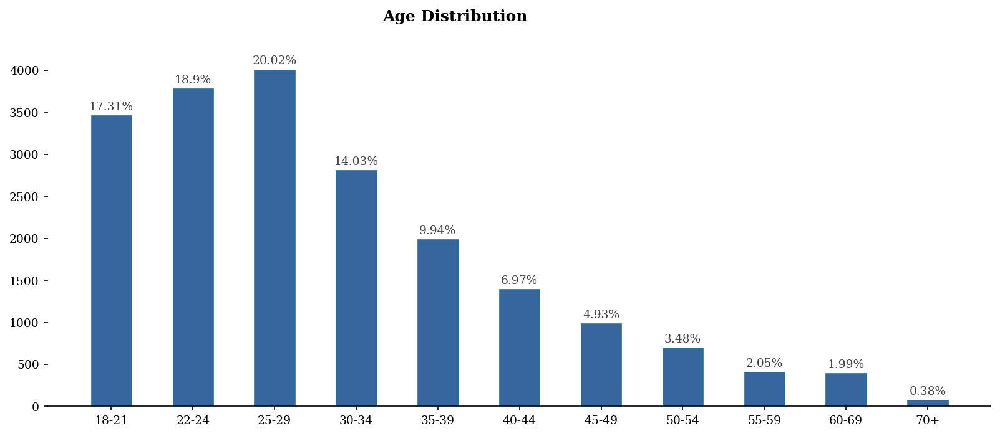

In [20]:
# Age distribution
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()
    
    fig, ax1 = plt.subplots(figsize=(13,5), facecolor='w')
    q1_fd = fd_saq(qd['Q1'], 'Age groups', ordered=False)
    labels = q1_fd['proportion']
    ax1.bar(q1_fd['Age groups'], q1_fd['freq'], width=0.5, color='#37659E', edgecolor='teal', 
            linewidth=0.3)

    for i in q1_fd.index:
        ax1.annotate(f"{labels[i]}%", xy=(i, q1_fd['freq'][i] + 100), va='center',
                    ha='center', fontfamily='serif', fontsize=9, color='#444444')

    fig.text(0.40,0.95, 'Age Distribution', fontfamily='serif', fontweight='bold', fontsize=12)
    ax1.set_ylim(0,4200)
    ax1.set_xticklabels(q1_fd['Age groups'], fontfamily='serif', fontsize=9)
    ax1.set_yticklabels(np.arange(0,4001,500),fontfamily='serif', fontsize=9)
#     ax1.grid(axis='y', linestyle='-', alpha=0.2)
    for s in ['top', 'left', 'right']:
        ax1.spines[s].set_visible(False)

# Notebook referenced : 2

<div class="alert alert-block alert-info">
<a id='obs-q1'></a>
<b>Observations:</b><br>
    - Most of the survey participants belong to younger age groups with 70% aged below 35.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q2 - Gender

In [21]:
# Gender frequency distribution
q2_fd = fd_saq(qd['Q2'], 'gender')
q2_fd

,gender,freq,proportion
0,Man,15789,78.80
1,Woman,3878,19.36
2,Prefer not to say,263,1.31
3,Prefer to self-describe,54,0.27
4,Nonbinary,52,0.26


##### Pie chart

In [22]:
# Pie chart
fig = px.pie(q2_fd, values=q2_fd.freq, names=q2_fd.gender, title='Gender Distribution',
             color_discrete_sequence=px.colors.sequential.RdBu_r,
             hover_data=['proportion'], labels={'proportion':'proportion'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(autosize=False, width=600, height=400)
fig.show()

<div class="alert alert-block alert-info">
<a id='obs-q2.1'></a>
<b>Observations:</b><br>
    - The gender ratio observed here corroborates the perception of under-representation of women in STEM domains.
</div>

### Gender-Age Distribution

In [23]:
# Create age subset for Man & Woman
df_ag = df[['Q1','Q2']].copy()
df_ag.loc[~df_ag.Q2.isin(['Man','Woman']),'Q2'] = 'Others'
q1q2 = df_ag[df_ag['Q2'] != 'Others'].groupby(['Q2'])['Q1'].value_counts().unstack().sort_index()
man = q1q2.loc['Man']
woman = q1q2.loc['Woman']

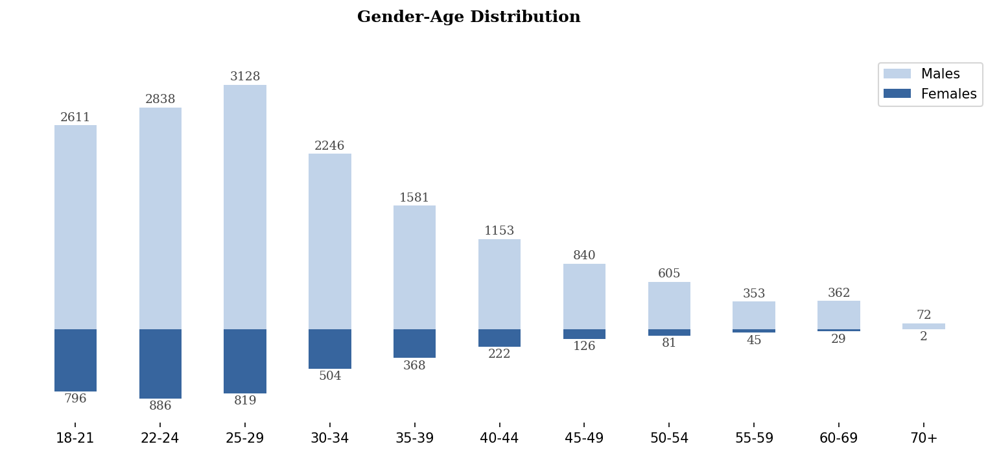

In [24]:
# Stacked bar chart
fig, ax = plt.subplots(1,1,figsize=(13,5), facecolor='w')
ax.bar(man.index, man, width=0.5, label='Males', color='#C1D3E9')
ax.bar(woman.index, -woman, width=0.5, label='Females', color='#37659E')
ax.set_ylim(-1200,3500)

for i in man.index:
    ax.annotate(f"{man[i]}", xy=(i,man[i]+100), va='center', ha='center', fontfamily='serif',
                fontweight='light', fontsize=9, color='#444444')
    
for i in woman.index:
    ax.annotate(f"{woman[i]}", xy=(i,-woman[i]-100), va='center', ha='center', fontfamily='serif',
                fontweight='light', fontsize=9, color='#444444')

for m in ['top','bottom','left','right']:
    ax.spines[m].set_visible(False)

fig.text(0.40,0.95, 'Gender-Age Distribution', fontfamily='serif', fontweight='bold', fontsize=12)
ax.set_yticks([])
ax.legend()
plt.show()

# Notebook referenced : 2

<div class="alert alert-block alert-info">
<a id='obs-q1q2'></a>
<b>Observations:</b><br>
    - Considering the ratios of no. of men per woman in the sample, the ratios get increasingly larger (> 4.3) in the 30+ age groups, whereas in the younger age groups (18-30), the ratios range between 3.2 to 3.8, which is less than the overall ratio (≈ 4).<br>
This augurs well for the correction of gender imbalance in this domain.
</div>

In [25]:
man/woman

Q1
18-21     3.280151
22-24     3.203160
25-29     3.819292
30-34     4.456349
35-39     4.296196
40-44     5.193694
45-49     6.666667
50-54     7.469136
55-59     7.844444
60-69    12.482759
70+      36.000000
dtype: float64

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q3 - Country of residence

In [26]:
# Frequency Distribution of countries
q3_fd = fd_saq(df['Q3'], 'country')

# No. of countries
print(f"Unique: {df['Q3'].nunique()}")

# Frequency Distribution of countries with respondents >300 (1.5% of sample)
q3_fd[q3_fd['freq']>300]

Unique: 55


,country,freq,proportion
0,India,5851,29.20
1,United States of America,2237,11.16
2,Other,1388,6.93
3,Brazil,694,3.46
4,Japan,638,3.18
5,Russia,582,2.90
6,United Kingdom of Great Britain and Northern I...,489,2.44
7,Nigeria,476,2.38
8,China,474,2.37
9,Germany,404,2.02


In [27]:
# Choropleth map
fig = px.choropleth(q3_fd, locations='country', color='freq', locationmode='country names',
                    color_continuous_scale='thermal', range_color = [0, 900])
fig.show()

# Notebook referenced : 3

<div class="alert alert-block alert-info">
<a id='obs-q3.1'></a>
<b>Observations:</b><br>
    - The survey sample has respondents from 54+ countries.<br>
    - India and USA are the largest contributors to the sample, with every other country constituting < 4% of the sample.
</div>

In [28]:
# Subsets of data for the 2 top countries by respondents
dfi = pd.DataFrame(df[df['Q3']=='India'])
dfu = pd.DataFrame(df[df['Q3']=='United States of America'])
print(dfi.shape, dfu.shape)

(5851, 355) (2237, 355)


### Region-wise Distribution

###### Map region to country

In [29]:
# Import country continent dataset
# source : https://www.kaggle.com/statchaitya/country-to-continent
continents = pd.read_csv('Input/countryContinent.csv', encoding = "ISO-8859-1")
continents.head(1)

,country,code_2,code_3,country_code,iso_3166_2,continent,sub_region,region_code,sub_region_code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,142.0,34.0


In [30]:
# Sub regions
print(continents['sub_region'].nunique())
print(continents['sub_region'].unique())

# Region dictionary
region_dict = {k:v for k,v in zip(continents['country'], continents['sub_region'])}

22
['Southern Asia' 'Northern Europe' 'Southern Europe' 'Northern Africa'
 'Polynesia' 'Middle Africa' 'Caribbean' nan 'South America'
 'Western Asia' 'Australia and New Zealand' 'Western Europe'
 'Eastern Europe' 'Central America' 'Western Africa' 'Northern America'
 'Southern Africa' 'South-Eastern Asia' 'Eastern Africa' 'Eastern Asia'
 'Melanesia' 'Micronesia' 'Central Asia']


In [31]:
# Create separate dataframe
q3_cont = pd.DataFrame({'country':df['Q3']})
# Map continents
q3_cont['continent'] = q3_cont['country'].map(continents.set_index('country')['continent'])
# Map region
q3_cont['sub_region'] = q3_cont['country'].map(region_dict)
q3_cont.head(1)

,country,continent,sub_region
1,Colombia,Americas,South America


In [32]:
# Replace longer/obscure names with shorter/familiar names
country_names_dict = {'United States of America':'USA',
                      'United Kingdom of Great Britain and Northern Ireland':'UK',
                      'Iran, Islamic Republic of...':'Iran',
                      'Republic of Korea':'North Korea'}

q3_cont['country'] = q3_cont['country'].replace(country_names_dict)

In [33]:
# Unmapped countries
print(q3_cont.isna().sum())
unmapped = q3_cont['country'][q3_cont['continent'].isna()].unique().tolist()
unmapped

country          0
continent     2665
sub_region    2665
dtype: int64


['Other', 'Russia', 'South Korea', 'Taiwan', 'Iran', 'North Korea']

In [34]:
# Track unmapped countries in continent data
continents[continents['country'].str.contains(r'Russia|Korea|Taiwan|Iran')]

,country,code_2,code_3,country_code,iso_3166_2,continent,sub_region,region_code,sub_region_code
104,Iran (Islamic Republic of),IR,IRN,364,ISO 3166-2:IR,Asia,Southern Asia,142.0,34.0
117,Korea (Democratic People's Republic of),KP,PRK,408,ISO 3166-2:KP,Asia,Eastern Asia,142.0,30.0
118,Korea (Republic of),KR,KOR,410,ISO 3166-2:KR,Asia,Eastern Asia,142.0,30.0
182,Russian Federation,RU,RUS,643,ISO 3166-2:RU,Europe,Eastern Europe,150.0,151.0
217,"Taiwan, Province of China",TW,TWN,158,ISO 3166-2:TW,Asia,Eastern Asia,142.0,30.0


In [35]:
# Continent / Sub-region dict for unmapped countries
region_dict2 = {'Russia':['Europe','Eastern Europe'], 'South Korea':['Asia','Easter Asia'],
                'Taiwan':['Asia','Eastern Asia'], 'Iran':['Asia','Southern Asia'],
                'North Korea':['Asia','Eastern Asia'], 'Other':['Other','Other']}

In [36]:
# Insert data for unmapped countries using region dict
for r in q3_cont[q3_cont['continent'].isna()].index:
    q3_cont.loc[r, 'continent'] = region_dict2[q3_cont.loc[r,'country']][0]
    q3_cont.loc[r, 'sub_region'] = region_dict2[q3_cont.loc[r,'country']][1]

In [37]:
# Unmapped countries
print(q3_cont.isna().sum())
q3_cont['country'][q3_cont['continent'].isna()].unique()

country       0
continent     0
sub_region    0
dtype: int64


array([], dtype=object)

In [38]:
# Confirm replacement
q3_cont[q3_cont['country'].str.contains('Taiwan', na=False)].head(1)

,country,continent,sub_region
57,Taiwan,Asia,Eastern Asia


##### Region-wise frequency distribution

In [39]:
# Region-wise frequency distribution
q3_cont_fd = fd_saq(q3_cont['sub_region'], title='sub_region')

# Plotly bar graph
fig = px.bar(q3_cont_fd, x='sub_region',y='freq', text='proportion', height=500, 
             title='Region-wise Distribution')
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})
fig.update_traces(marker=dict(color='#37659E', opacity=1, line=dict(color='teal', width=0.3)))
fig.update_traces(texttemplate='%{text:i}%', textposition='outside')
fig.show()

<div class="alert alert-block alert-info">
<a id='obs-q3.2'></a>
<b>Observations:</b><br>
    - Regions of Southern Asia (1.953b), Northern America (0.37b), and Eastern Asia (1.681b) make up 52% of the sample and are home to 51% of the world population (7.842b) as well.<br>
    
<i>Population figures (as of Jan 2021):</i>&ensp;
    <a href="https://www.worldometers.info/world-population/southern-asia-population/">Souther Asia</a>,&nbsp;
    <a href="https://www.worldometers.info/world-population/northern-america-population/">Northern America Asia</a>,&nbsp;
    <a href="https://www.worldometers.info/world-population/eastern-asia-population/">East Asia</a>,&nbsp;
    <a href="https://www.worldometers.info/world-population/">World</a>
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q4 - Education

In [40]:
qans['Q4']

['What is the highest level of formal education that you have attained or plan to attain within the next 2 years?',
 'Doctoral degree',
 'Master’s degree',
 'Bachelor’s degree',
 'No formal education past high school',
 'Some college/university study without earning a bachelor’s degree',
 'Professional degree',
 'I prefer not to answer',
 nan]

In [41]:
# Setting custom order
Q4_ans = ["I prefer not to answer","No formal education past high school",
          "Some college/university study without earning a bachelor’s degree",
          "Professional degree", "Bachelor’s degree","Master’s degree","Doctoral degree"]
Q4_ans_r = Q4_ans[::-1]

q4_fd = fd_saq(df['Q4'],'education').set_index('education').loc[Q4_ans].reset_index()
q4i_fd = fd_saq(df['Q4'],'education').set_index('education').loc[Q4_ans].reset_index()
q4u_fd = fd_saq(dfu['Q4'],'education').set_index('education').loc[Q4_ans].reset_index()

<ipython-input-42-d15ce47d253e>:42: UserWarning:

FixedFormatter should only be used together with FixedLocator



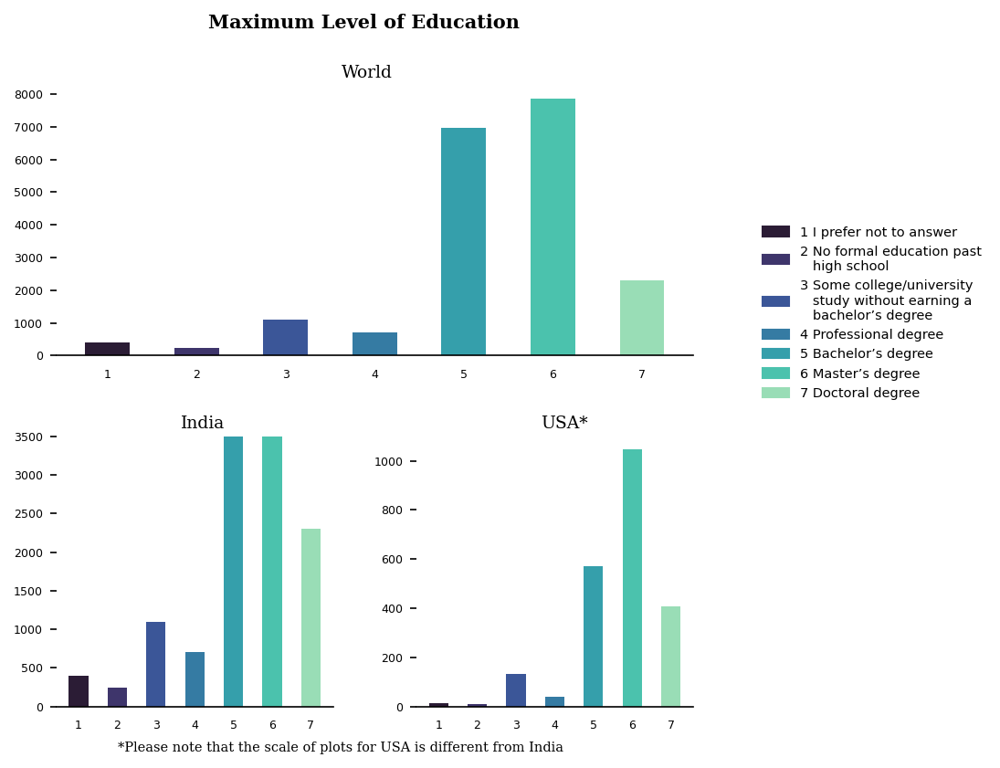

In [42]:
# Bar plot
fig = plt.figure(figsize=(6,6), facecolor='w') # create figure
gs = fig.add_gridspec(2, 2)
gs.update(wspace=0.3, hspace=0.3)
ax0 = fig.add_subplot(gs[0, 0:2])
ax1 = fig.add_subplot(gs[1, 0], ylim=(0, 3500)) # create axes
ax2 = fig.add_subplot(gs[1, 1]) # create axes

xlbl = q4_fd['education'].values.tolist()

ax0.bar(q4_fd['education'], q4_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q4_fd)))
ax1.bar(q4i_fd['education'], q4i_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q4_fd)))
ax2.bar(q4u_fd['education'], q4u_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q4_fd)))

clrs = dict(zip(q4_fd['education'].values.tolist(), sns.color_palette('mako',len(q4_fd))))
labels = list(clrs.keys())
handles = [plt.Rectangle((0,0),1,1, color=clrs[label]) for label in labels]
labels = [str(i)+' '+l for i,l in zip(range(1,len(q4_fd)+1), labels)]
labels = ['\n   '.join(wrap(l, 30)) for l in labels]
ax0.legend(handles, labels, loc=0, prop={'size':7}, frameon=False, 
           bbox_to_anchor=(1.1, 0.5), borderaxespad=0)
# ax2.legend(handles, labels, loc=0, prop={'size':7}, frameon=False, 
#            bbox_to_anchor=(1.45, 1), borderaxespad=0)

fig.text(0.31,0.95, 'Maximum Level of Education', fontfamily='serif', fontweight='bold',fontsize=10)
ax0.text(ax0.get_xlim()[1]*0.4, ax0.get_ylim()[1]*1.03,'World', fontfamily='serif', fontsize=9)
ax1.text(ax1.get_xlim()[1]*0.4, ax1.get_ylim()[1]*1.03,'India', fontfamily='serif', fontsize=9)
ax2.text(ax2.get_xlim()[1]*0.4, ax2.get_ylim()[1]*1.03,'USA*', fontfamily='serif', fontsize=9)
fig.text(0.2,0.07, '*Please note that the scale of plots for USA is different from India', 
         fontfamily='serif',fontsize=7)

for s in ["top","right","left"]:
    ax1.spines[s].set_visible(False)
    ax2.spines[s].set_visible(False)
    ax0.spines[s].set_visible(False)


for f in [ax0,ax1,ax2]:
    f.set_xticklabels(range(1,len(q4_fd)+1), fontsize=6)
    f.yaxis.set_tick_params(labelsize=6)
    f.tick_params(bottom=False)

# Notebook referenced : 4

<div class="alert alert-block alert-info">
<a id='obs-q4'></a>
<b>Observations:</b><br>
    - Participants having (or planning to complete) Master's are the largest group.<br>
    - The distributions for India and USA are noticably different.<br><br> 
    <b>India</b><br>
    - India's overall representation in the survey sample is 29%. <br>
    - It's considerably under-representated in the educational categories of:<br>
    &emsp;• No formal education past high school : 12% (WN 3)<br>
    &emsp;• Some college/university study without earning a Bachelor's : 19% (WN 4)<br>
    &emsp;• Doctoral degree : 12% (WN 5)<br>
    - India has a larger proportion of Bachelor's (43%) than the overall proportion (36%). (WN 6)<br>
    - In fact, the proportion of Bachelor's drops by 7 percentage points (or 7pp or 7%p) to 28.5%, if the  sample's from India are not taken into account. (WN 7)<br>
    - And the proportion of Master's and Doctoral degree's increases by approx. 3%p each. (WN 7)<br><br>
    <b>USA</b><br>
    - USA's overall representation in the survey sample is 11%. <br>
    - It has a significantly larger representation in the eduacational category of Doctoral (18%) and a  lesser representation in Bachelor's (8%), High School (5%) and Professionl (6%). (WN 8)<br>

<i><b>Note: </b> percentage points have been denoted by %p.</i><br><br>
<i>Workings below</i>
</div>

[back to top](#toc)

##### '################ workings

In [43]:
# WN 1 - Country-wise survey distribution
q3_fd.head(2)

,country,freq,proportion
0,India,5851,29.20
1,United States of America,2237,11.16


In [44]:
# WN 2 - Distribution of Education
q4_fd.iloc[::-1]

,education,freq,proportion
6,Doctoral degree,2302,11.76
5,Master’s degree,7859,40.16
4,Bachelor’s degree,6978,35.66
3,Professional degree,699,3.57
2,Some college/university study without earning ...,1092,5.58
1,No formal education past high school,240,1.23
0,I prefer not to answer,399,2.04


In [45]:
# WN 3 - Country-wise distribution of 'No formal education past high school'
fd(qd['Q3'], qd['Q4'], 'high', contains=True).head()

,criteria,freq,proportion
0,Other,31,12.92
1,India,29,12.08
2,Russia,20,8.33
3,Japan,17,7.08
4,United States of America,11,4.58


In [46]:
# WN 4 - Country-wise distribution of 'Some college .... without Bachelor's'
fd(qd['Q3'], qd['Q4'], 'without', contains=True).head()

,criteria,freq,proportion
0,India,205,18.77
1,United States of America,131,12.00
2,Other,83,7.60
3,Japan,60,5.49
4,Russia,51,4.67


In [47]:
# WN 5 - Country-wise distribution of 'Doctoral degree'
fd(qd['Q3'], qd['Q4'], "Doctoral", contains=True).head()

,criteria,freq,proportion
0,United States of America,407,17.68
1,India,275,11.95
2,Other,218,9.47
3,United Kingdom of Great Britain and Northern I...,122,5.30
4,Germany,101,4.39


In [48]:
# WN 6 - Country-wise distribution of 'Bachelor's degree'
fd(qd['Q3'], qd['Q4'], "Bachelor", contains=True).head()

,criteria,freq,proportion
0,India,3025,43.35
1,United States of America,572,8.20
2,Other,334,4.79
3,Brazil,271,3.88
4,Nigeria,269,3.85


In [49]:
# WN 7 - Educational distribution without India
custom_sort2(fd(qd['Q4'], qd['Q3'],'India', otherthan1=True), 'criteria', Q4_ans_r)

,criteria,freq,proportion
0,Doctoral degree,2027,14.64
1,Master’s degree,6010,43.41
2,Bachelor’s degree,3953,28.55
3,Professional degree,486,3.51
4,Some college/university study without earning ...,887,6.41
5,No formal education past high school,211,1.52
6,I prefer not to answer,270,1.95


In [50]:
# Country-wise distribution of 'Master's degree'
fd(qd['Q3'], qd['Q4'], 'Master', contains=True).head()

,criteria,freq,proportion
0,India,1849,23.53
1,United States of America,1046,13.31
2,Other,592,7.53
3,Japan,268,3.41
4,Russia,242,3.08


In [51]:
# WN 8 - Educational Distribution - USA (with sample weights of classes in criteria)
custom_sort2(fd2(qd['Q4'], qd['Q3'], 'United States of America'), 'criteria', ordered_list=Q4_ans_r)

,criteria,freq,proportion,criteria_weight
0,Doctoral degree,407,18.33,17.68
1,Master’s degree,1046,47.10,13.31
2,Bachelor’s degree,572,25.75,8.20
3,Professional degree,40,1.80,5.72
4,Some college/university study without earning ...,131,5.90,12.00
5,No formal education past high school,11,0.50,4.58
6,I prefer not to answer,14,0.63,3.51


In [52]:
# WN 9 - Educational distribution - India
custom_sort2(fd(qd['Q4'], qd['Q3'],'India'), 'criteria', Q4_ans_r)

,criteria,freq,proportion
0,Doctoral degree,275,4.80
1,Master’s degree,1849,32.30
2,Bachelor’s degree,3025,52.84
3,Professional degree,213,3.72
4,Some college/university study without earning ...,205,3.58
5,No formal education past high school,29,0.51
6,I prefer not to answer,129,2.25


In [53]:
# Difference in internal educational distribution of India vis-a-vis USA
diff_ind_usa(qd['Q4'])

,world,india,usa,diff %
criteria,,,,
Master’s degree,40.16,32.30,47.10,-36.85
Bachelor’s degree,35.66,52.84,25.75,75.97
Doctoral degree,11.76,4.80,18.33,-115.05
Some college/university study without earning a bachelor’s degree,5.58,3.58,5.90,-41.58
Professional degree,3.57,3.72,1.80,53.78
I prefer not to answer,2.04,2.25,0.63,79.41
No formal education past high school,1.23,0.51,0.50,0.81


##### #'################ workings'

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q5 - Job role

In [54]:
Q5_ans = ['Student','Currently not employed','Other','Business Analyst','Data Analyst',
          'Product/Project Manager','Software Engineer','DBA/Database Engineer','Data Engineer',
          'Research Scientist','Machine Learning Engineer','Statistician','Data Scientist']
Q5_ans_r = Q5_ans[::-1]
q5_fd = fd_saq(df['Q5'],'job_role').set_index('job_role').loc[Q5_ans].reset_index()
q5i_fd = fd_saq(dfi['Q5'],'job_role').set_index('job_role').loc[Q5_ans].reset_index()
q5u_fd = fd_saq(dfu['Q5'],'job_role').set_index('job_role').loc[Q5_ans].reset_index()

<ipython-input-55-f04ee980baf2>:39: UserWarning:

FixedFormatter should only be used together with FixedLocator



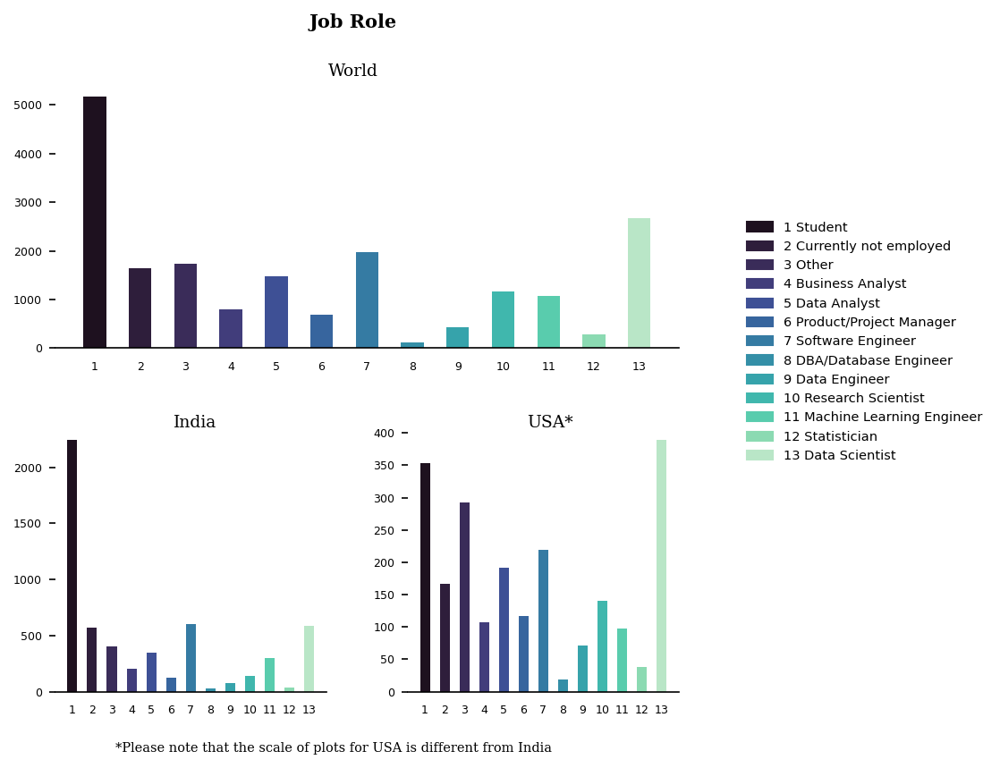

In [55]:
# Bar plot
fig = plt.figure(figsize=(6,6), facecolor='w')
gs = fig.add_gridspec(2, 2)
gs.update(wspace=0.3, hspace=0.3)
ax0 = fig.add_subplot(gs[0, 0:2])
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])

xlbl = q5_fd['job_role'].values.tolist()

ax0.bar(q5_fd['job_role'], q5_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q5_fd)))
ax1.bar(q5i_fd['job_role'], q5i_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q5_fd)))
ax2.bar(q5u_fd['job_role'], q5u_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q5_fd)))

clrs = dict(zip(q5_fd['job_role'].values.tolist(), sns.color_palette('mako',len(q5_fd))))
labels = list(clrs.keys())
handles = [plt.Rectangle((0,0),1,1, color=clrs[label]) for label in labels]
labels = [str(i)+' '+l for i,l in zip(range(1,len(q5_fd)+1), labels)]
labels = ['\n'.join(wrap(l, 30)) for l in labels]
ax0.legend(handles, labels, loc=0, prop={'size':7}, frameon=False, 
           bbox_to_anchor=(1.1, 0.5), borderaxespad=0)

fig.text(0.44,0.95, 'Job Role', fontfamily='serif', fontweight='bold',fontsize=10)
ax0.text(ax0.get_xlim()[1]*0.4, ax0.get_ylim()[1]*1.03,'World', fontfamily='serif', fontsize=9)
ax1.text(ax1.get_xlim()[1]*0.4, ax1.get_ylim()[1],'India', fontfamily='serif', fontsize=9)
ax2.text(ax2.get_xlim()[1]*0.4, ax2.get_ylim()[1],'USA*', fontfamily='serif', fontsize=9)
fig.text(0.2,0.05, '*Please note that the scale of plots for USA is different from India', 
         fontfamily='serif',fontsize=7)

for s in ["top","right","left"]:
    ax1.spines[s].set_visible(False)
    ax2.spines[s].set_visible(False)
    ax0.spines[s].set_visible(False)

for f in [ax0,ax1,ax2]:
    f.set_xticklabels(range(1,len(q5_fd)+1), fontsize=6)
    f.yaxis.set_tick_params(labelsize=6)
    f.tick_params(bottom=False)

In [56]:
# Distribution of Job-roles within sample (Overall, India, USA)
build_graph(qd['Q5'], hgt=500, graph_title='Job-Role distribution')

In [57]:
## India - Differential proportion compared with overall proportion of 0.292
diff = ((q5i_fd['freq']/q5_fd['freq']) - 0.292).round(4)*100
clrs = list(np.where(diff.values < 0, '#B51A62', '#37659E'))

# Plot
fig = go.Figure(go.Bar(x=q5_fd['job_role'], y=diff.values, text=diff.values.round(3), 
                       marker_color=clrs))
fig.update_layout(title={'text':'India - Change in Job Role proportion compared with'+
                        ' overall sample proportion (29.2%)<br>(in percentage points (%p))', 
                         'x':0.5, 'xanchor':'center'}, plot_bgcolor='#fff')
fig.update_traces(texttemplate='%{text:i} %p', textposition='outside', textfont_size=9, 
                  textfont_color='black')
fig.update_xaxes(categoryorder='array', categoryarray=q5i_fd['job_role'], visible=True)
fig.show()


## USA - Differential proportion compared with overall proportion of 0.112
diff = ((q5u_fd['freq']/q5_fd['freq']) - 0.112).round(4)*100
clrs = list(np.where(diff.values < 0, '#B51A62', '#37659E'))

# Plot
fig = go.Figure(go.Bar(x=q5_fd['job_role'], y=diff.values, text=diff.values.round(3), 
                       marker_color=clrs))
fig.update_layout(title={'text':'USA - Change in Job Role proportion compared with'+
                        ' Overall sample proportion (11.2%)<br>(in percentage points (%p))', 
                         'x':0.5, 'xanchor':'center'}, plot_bgcolor='#fff')
fig.update_traces(texttemplate='%{text:i} %p', textposition='outside', textfont_size=9, 
                  textfont_color='black')
fig.update_xaxes(categoryorder='array', categoryarray=q5i_fd['job_role'])
fig.show()

<div class="alert alert-block alert-info">
<a id='obs-q5'></a>
<b>Observations:</b><br>
    - Students comprise the largest group in the survey sample (27%) and Data Scientists the 2nd largest (14%).<br>
    - In this criteria, the difference between the distributions for India and USA is even more evident.<br><br> 
    <b>India</b><br>
    - India's overall proportion in the survey sample is 29%. <br>
    - India's proportion significantly changes from its  overall proportion in the roles of:<br>
    &emsp; <i>Significantly more:</i><br>
    &emsp;• Student : 43%<br>
    &emsp; <i>Significantly less:</i><br>
    &emsp;• Statistician : 12%<br>
    &emsp;• Research Scientist : 12%<br>
    &emsp;• Data Engineer : 11%<br>
    &emsp;• Product/Project Manager : 11%<br><br>
    <b>USA</b><br>
    - USA's overall proportion in the survey sample is 11%. <br>
    - USA's proportion is significantly different in the following roles:<br>
    &emsp; <i>Significantly more:</i><br>
    &emsp;• Product/Project Manager : 17%<br>
    &emsp;• Data Engineer : 16%<br>
    &emsp; <i>Significantly less:</i><br>
    &emsp;• Student : 7%<br>

<i>Workings below</i>
</div>

[back to top](#toc)

##### #'################ workings

In [58]:
# Frequency distribution - Students
fd(qd['Q3'], qd['Q5'], 'Student').head(2)

,criteria,freq,proportion
0,India,2242,43.36
1,United States of America,353,6.83


In [59]:
# Frequency distribution - Statistician
fd(qd['Q3'], qd['Q5'], 'Statistician').head(3)

,criteria,freq,proportion
0,United States of America,38,13.10
1,Other,36,12.41
2,India,34,11.72


In [60]:
# Frequency distribution - Research Scientist
fd(qd['Q3'], qd['Q5'], 'Research Scientist').head(2)

,criteria,freq,proportion
0,United States of America,140,11.93
1,India,140,11.93


In [61]:
# Frequency distribution - Product/Project Manager
fd(qd['Q3'], qd['Q5'], 'Product/Project Manager').head(2)

,criteria,freq,proportion
0,India,127,18.35
1,United States of America,117,16.91


In [62]:
# Frequency distribution - Data Engineer
fd(qd['Q3'], qd['Q5'], 'Data Engineer').head(2)

,criteria,freq,proportion
0,India,79,18.08
1,United States of America,71,16.25


##### #'################ workings'

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q6 - Programming experience

In [63]:
Q6_ans = ['I have never written code','< 1 years','1-2 years','3-5 years','5-10 years',
          '10-20 years','20+ years']
Q6_ans_r = Q6_ans[::-1]
q6_fd = fd_saq(df['Q6'],'prog_exp').set_index('prog_exp').loc[Q6_ans].reset_index()
q6i_fd = fd_saq(dfi['Q6'],'prog_exp').set_index('prog_exp').loc[Q6_ans].reset_index()
q6u_fd = fd_saq(dfu['Q6'],'prog_exp').set_index('prog_exp').loc[Q6_ans].reset_index()

<ipython-input-64-b0ebcbf52b69>:37: UserWarning:

FixedFormatter should only be used together with FixedLocator



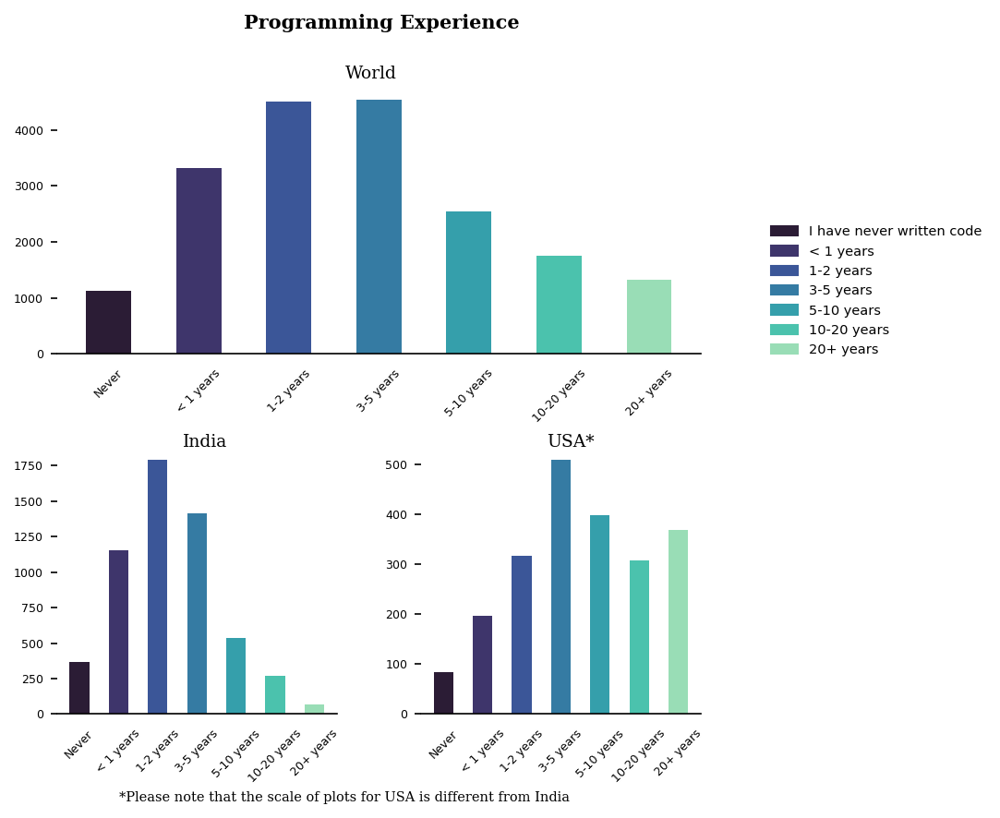

In [64]:
# Bar plot
fig = plt.figure(figsize=(6,6), facecolor='w')
gs = fig.add_gridspec(2, 2)
gs.update(wspace=0.3, hspace=0.35)
ax0 = fig.add_subplot(gs[0, 0:2])
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])

xlbl = q6_fd['prog_exp'].values.tolist()

ax0.bar(q6_fd['prog_exp'], q6_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q6_fd)))
ax1.bar(q6i_fd['prog_exp'], q6i_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q6_fd)))
ax2.bar(q6u_fd['prog_exp'], q6u_fd['freq'], width=0.5, label=xlbl, 
        color=sns.color_palette('mako',len(q6_fd)))

clrs = dict(zip(q6_fd['prog_exp'].values.tolist(), sns.color_palette('mako',len(q6_fd))))
labels = list(clrs.keys())
handles = [plt.Rectangle((0,0),1,1, color=clrs[label]) for label in labels]
ax0.legend(handles, labels, loc=0, prop={'size':7}, frameon=False, 
           bbox_to_anchor=(1.1, 0.5), borderaxespad=0)

fig.text(0.35,0.95, 'Programming Experience', fontfamily='serif', fontweight='bold',fontsize=10)
ax0.text(ax0.get_xlim()[1]*0.4, ax0.get_ylim()[1]*1.03,'World', fontfamily='serif', fontsize=9)
ax1.text(ax1.get_xlim()[1]*0.4, ax1.get_ylim()[1],'India', fontfamily='serif', fontsize=9)
ax2.text(ax2.get_xlim()[1]*0.4, ax2.get_ylim()[1],'USA*', fontfamily='serif', fontsize=9)
fig.text(0.2,0.02, '*Please note that the scale of plots for USA is different from India', 
         fontfamily='serif',fontsize=7)

for s in ["top","right","left"]:
    ax1.spines[s].set_visible(False)
    ax2.spines[s].set_visible(False)
    ax0.spines[s].set_visible(False)

for f in [ax0,ax1,ax2]:
    f.set_xticklabels(['Never']+labels[1:], fontsize=6, rotation=45)
    f.yaxis.set_tick_params(labelsize=6)
    f.tick_params(bottom=False)

<div class="alert alert-block alert-info">
<a id='obs-q6'></a>
<b>Observations:</b><br>
    - Around 70% of the respondants have programming experience of &lt; 5 years.<br>
    - Shape of the distribution for India is denser towards classes with programming experience &lt;5 yrs, with approx. 84% respondents falling within those classes.<br>
    - Shape of the distribution for USA is denser towards classes with programming experience &gt;3 yrs, with approx. 73% respondents falling within those classes.<br>
    - Looking at the differential proportion graphs below, we can see that: <br>
    &emsp;• India has very few respondents with 10+ yrs expericence<br>
    &emsp;• USA has significantly more respondents with 10+ yrs expericence<br>

<i>Workings below</i>
</div>

##### '################ workings

In [65]:
a,b = differential_graph(qd['Q6'], order=Q6_ans)
a.update_layout(autosize=False, width=850, height=450)
b.update_layout(autosize=False, width=850, height=450)
a.show()
b.show()

In [66]:
# Frequency distribution - World
q6_fd

,prog_exp,freq,proportion
0,I have never written code,1124,5.88
1,< 1 years,3313,17.33
2,1-2 years,4505,23.56
3,3-5 years,4546,23.78
4,5-10 years,2552,13.35
5,10-20 years,1751,9.16
6,20+ years,1329,6.95


In [67]:
# Frequency distribution - India
q6i_fd

,prog_exp,freq,proportion
0,I have never written code,364,6.50
1,< 1 years,1155,20.64
2,1-2 years,1789,31.97
3,3-5 years,1416,25.30
4,5-10 years,537,9.60
5,10-20 years,270,4.82
6,20+ years,65,1.16


In [68]:
# Frequency distribution - USA
q6u_fd

,prog_exp,freq,proportion
0,I have never written code,85,3.89
1,< 1 years,197,9.02
2,1-2 years,317,14.52
3,3-5 years,509,23.32
4,5-10 years,399,18.28
5,10-20 years,308,14.11
6,20+ years,368,16.86


##### '################ workings'

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q4 & Q5 - Education & Job role

##### a) Heatmap

In [69]:
# Heatmap
fig = px.density_heatmap(df, x='Q5',y='Q4', color_continuous_scale='Blues',
                         category_orders={'Q5':Q5_ans, 'Q4':Q4_ans_r})
fig.update_layout(title={'text':'Education & Job Role', 'x':0.68, 'xanchor': 'center'})
fig.update_layout(autosize=False, width=990, height=500)
fig.show()

##### b) Stacked Bar Chart

In [70]:
# Shortened names
role_dict = {'Doctoral degree': 'Doctoral degree',
             'Master’s degree': 'Master’s degree',
             'Bachelor’s degree': 'Bachelor’s degree',
             'Professional degree': 'Professional degree',
             'Some college/university study without earning a bachelor’s degree': 'Study without degree',
             'No formal education past high school': 'High school',
             'I prefer not to answer': 'No answer'}

In [71]:
# Percentage Distribution
edu_role1 = pd.DataFrame()
edu_role1['Overall'] = df['Q4'].value_counts(normalize=True, sort=False)
for role in Q5_ans:
    edu_role1[role] = df[df.Q5==role]['Q4'].value_counts(normalize=True, sort=False)
edu_role = edu_role1.reindex(Q4_ans_r, copy=True)
edu_role.round(4)*100

,Overall,Student,Currently not employed,Other,Business Analyst,Data Analyst,Product/Project Manager,Software Engineer,DBA/Database Engineer,Data Engineer,Research Scientist,Machine Learning Engineer,Statistician,Data Scientist
Doctoral degree,11.76,4.97,7.20,12.78,4.64,5.22,7.66,5.08,4.8,9.15,58.52,13.68,27.59,17.12
Master’s degree,40.16,30.57,35.53,43.98,53.13,48.47,53.61,38.57,44.0,49.20,28.71,43.53,39.66,51.16
Bachelor’s degree,35.66,49.89,42.74,29.65,29.45,33.97,26.01,42.78,32.8,30.66,5.71,32.35,23.10,24.22
Professional degree,3.57,1.66,2.91,5.53,6.27,4.75,6.50,4.47,6.4,2.97,4.60,2.50,5.17,3.21
Some college/university study without earning a bachelor’s degree,5.58,9.84,5.63,4.49,2.76,4.68,3.76,5.54,4.8,4.81,0.77,4.99,3.79,2.39
No formal education past high school,1.23,1.28,1.88,1.78,1.88,0.95,1.01,1.47,1.6,0.46,0.43,0.92,0.69,0.56
I prefer not to answer,2.04,1.78,4.12,1.78,1.88,1.97,1.45,2.08,5.6,2.75,1.28,2.03,NaN,1.35


In [72]:
# Stacked Bar Chart
fig = go.Figure()
clrs = ['rgba'+str(clr) for clr in sns.color_palette('ocean_r',len(edu_role.index))]
clrs1 = sns.color_palette('ocean_r', len(edu_role.index))

# Subplot for color key
colorscale = ff.create_annotated_heatmap(z=[[1,2,3,4,5,6,7]],
                annotation_text=[["<span style='font-size:12px; font-family: Tahoma'>"+text+"</span>" 
                    for text in [re.sub('\n','<br>',fill(role_dict[w],14)) for w in edu_role.index]]],
                colorscale=clrs,
                font_colors = ['white','white','white','white','white','white','white'],
                xgap = 0.05, showscale = False)

trcs = ['trace'+str(i) for i in range(1,len(edu_role.index)+1)]
i = 0
for trc in trcs:
    globals()[trc] = go.Bar(y=edu_role.columns, x=edu_role.iloc[i,:], orientation="h",
                            name=edu_role.index[i], marker=dict(color=clrs[i]))
    i += 1

fig = subplots.make_subplots(rows=2, cols=1, shared_yaxes=True, shared_xaxes=False, 
                             horizontal_spacing = 0, vertical_spacing = 0.01, 
                             row_heights=[0.18, 0.82])
fig.append_trace(colorscale.data[0],1,1)

for trc in trcs:
    fig.append_trace(globals()[trc],2,1)

order = edu_role.loc['Doctoral degree'].sort_values(ascending=True).keys().tolist()
order.remove('Overall')
fig.update_layout(
    title={'text':'Education & Job Role - Percentage Distribution', 'x':0.57,'xanchor': 'center'},
    yaxis2={'categoryorder':'array', 'categoryarray':order+['Overall']},
    barmode="relative", bargap = 0.05,
    plot_bgcolor = '#fff',
    xaxis = dict(title="<span style='font-size:13px; font-family:Helvetica'><b>Color Keys: </b>Educational qualifications by job role</span>", 
                 side="top",title_standoff=0, domain=[0,0.95], showticklabels = False),
    yaxis = dict(domain=[0.85,1], showticklabels = False),
    xaxis2 = dict(domain=[0,1], tickformat = '%'),
    legend=dict(orientation="h"), showlegend=False,
    autosize=False, width=850, height=600,
    margin=dict(l=0, r=0, b=0, pad=3))

# Workaround to show annotations with ff.create_annotated_heatmap() subplots.
annot1 = list(colorscale.layout.annotations)
for k in range(len(annot1)):
    annot1[k]['xref'] = 'x'
    annot1[k]['yref'] = 'y'
fig.update_layout(annotations=annot1) 

fig.show()

# Notebook referenced : 5

##### c) Comparitive bar chart

In [73]:
# Role-wise distribution of Educational Qualifications
build_graph(qd['Q4'], qd['Q5'], 'Distribution of Educational Qualifications', order=Q4_ans_r, hgt=550)

<div class="alert alert-block alert-info">
<a id='obs-q4q5'></a>
<b>Observations:</b><br>
    1. <b>Students</b><br>
    &emsp;<i>Overall</i><br>
    &emsp;• largest proportion : Bachelor's : 50%<br>
    &emsp;<i>India</i><br>
    &emsp;• largest proportion : Bachelor's : 63%<br>
    &emsp;<i>USA</i><br>
    &emsp;• largest proportion : Master's : 44%<br>
    &emsp;• with Bachelor's degree - 27%, which is significantly lower than the overall Bachelor's student percentage of 50%.<br>
    2. <b>Data Scientist</b><br>
    &emsp;<i>Overall</i><br>
    &emsp;• largest proportion : Master's : 51%<br>
    &emsp;• Doctoral : 17%, Bachelor's : 24%<br>
    &emsp;<i>India</i><br>
    &emsp;• largest proportion : Master's : 44%<br>
    &emsp;• Doctoral : 5%, Bachelor's : 42%<br> 
    &emsp;<i>USA</i><br>
    &emsp;• largest proportion : Master's : 52%<br>
    &emsp;• Doctoral : 30%, Bachelor's : 15%<br> 
    3. <b>Statistician</b><br>
    &emsp;<i>Overall</i><br>
    &emsp;• largest proportion : Master's : 40%<br>
    &emsp;• Doctoral : 28%, Bachelor's : 23%<br>
    &emsp;<i>India</i><br>
    &emsp;• largest proportion : Master's : 62%<br>
    &emsp;• Doctoral : 21%, Bachelor's : 9%<br> 
    &emsp;<i>USA</i><br>
    &emsp;• largest proportion : Doctoral : 47%<br>
    &emsp;• Master's : 37%, Bachelor's : 8%<br> 
    
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q4 & Q6 - Education & Coding experience

In [74]:
# Heatmap
fig = px.density_heatmap(df, x='Q6',y='Q4', color_continuous_scale='Blues',
                         category_orders={'Q4':Q4_ans_r, 'Q6':Q6_ans})
fig.update_layout(title={'text':'Education & Coding Experience', 'x':0.68, 'xanchor': 'center'})
fig.show()

<div class="alert alert-block alert-info">
<a id='obs-q4q6'></a>
<b>Observations:</b><br>
    - Majority of the involvement in the survey was by those who have learned coding within the last 5 yrs and have a Bachelor's or Master's degree (≈50%).
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q5 & Q6 - Job role and Coding experience

In [75]:
# Heatmap
fig = px.density_heatmap(df, x='Q6',y='Q5', color_continuous_scale='Blues',
                         category_orders={'Q5':Q5_ans, 'Q6':Q6_ans})
fig.update_layout(title={'text':'Job role & Coding Experience', 'x':0.58, 'xanchor': 'center'})
fig.update_layout(autosize=False, width=800, height=550)
fig.update_yaxes(dict(ticks = "outside", tickcolor='white', ticklen=0))
fig.update_xaxes(domain=[0.2, 1])
fig.show()

In [76]:
# Comparitive bar chart (interactive)
build_graph(qd['Q6'], qd['Q5'], 'Coding Experience', order=Q6_ans, label_angle=-10, hgt=450)

<div class="alert alert-block alert-info">
<a id='obs-q5q6'></a>
<b>Observations:</b><br>
    1. <b>Data Scientist</b><br>
    &emsp;<i>Overall</i> - Distribution is slightly left-skewed, with 50% having programming experience of 3-10 yrs.<br>
    &emsp;<i>India</i> - Distribution is roughly symmetrical, with 50% having 3-10 yrs experience.<br>
    &emsp;<i>USA</i> - Distribution is negatively skewed, with 54% having 3-10 yrs experience and 90%+ with experience &gt;3 yrs.<br>
    2. <b>Statistician</b><br>
    &emsp;<i>Overall</i> - Distribution is spread out.<br>
    &emsp;<i>India</i> - Approx. 88% have experience &lt;5 yrs.<br>
    &emsp;<i>USA</i> - Approx. 85% have experience &gt;3 yrs.<br>
    
    
</div>

##### '################ workings

In [77]:
# Frequency distribution for Programming Experience - Data Scientist
custom_sort2(fd(qd['Q6'], qd['Q5'], 'Data Scientist', qd['Q3'], 'India'), 'criteria', Q6_ans)

,criteria,freq,proportion
0,I have never written code,22,3.82
1,< 1 years,79,13.72
2,1-2 years,143,24.83
3,3-5 years,173,30.03
4,5-10 years,108,18.75
5,10-20 years,38,6.60
6,20+ years,13,2.26


In [78]:
# Frequency distribution for Programming Experience - Data Scientist
custom_sort2(fd(qd['Q6'], qd['Q5'], 'Data Scientist', qd['Q3'], 'United States of America'), 
             'criteria', Q6_ans)

,criteria,freq,proportion
0,I have never written code,2,0.52
1,< 1 years,3,0.77
2,1-2 years,27,6.96
3,3-5 years,98,25.26
4,5-10 years,114,29.38
5,10-20 years,76,19.59
6,20+ years,68,17.53


##### '################ workings'

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q7 - Regularly used programming language

In [79]:
# Frequency distribution
q7_fd = fd(qd['Q7'], title='language')
q7i_fd = fd(qd['Q7'], qd['Q3'], 'India', title='language')
q7u_fd = fd(qd['Q7'], qd['Q3'], 'United States of America', title='language')

In [80]:
# Bar chart with plotly go
fig = go.Figure([go.Bar(x = q7_fd.language, y = q7_fd.freq, marker_color='#37659E',
                       marker_line_color='teal',marker_line_width=0.3, opacity=1, text=q7_fd.freq)])
fig.update_layout(title={'text':'Regularly Used Programming Language', 'x':0.5, 'xanchor': 'center'})
fig.update_layout(autosize=False, width=750, height=480)
fig.update_layout({'plot_bgcolor': '#fff'})
fig.update_traces(texttemplate='%{text:.2}', textposition='outside', textfont_size=9)
fig.show()

In [81]:
# Comparitive bar plot - Overall v India v USA
build_graph(qd['Q7'], hgt=450, graph_title='Regularly Used Programming Language')

<div class="alert alert-block alert-info">
<a id='obs-q7'></a>
<b>Observations:</b><br>
    - The overall trends and the trends in India and USA seem to be more or less similar.<br>
    - USA has higher usage of R, SQL and Bash and lesser usage of C and C++, as compared with India and the overall trend.<br>
    - India has a higher usage C.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q5 & Q7 - Role & Language

In [82]:
# Role-wise distribution of preferred programming language
build_graph(qd['Q7'], qd['Q5'], 'Preferred Programming Language', hgt=500, label_angle=0)

<div class="alert alert-block alert-info">
<a id='obs-q5q7'></a>
<b>Observations:</b><br>
    1. <b>Data Scientist</b><br>
    &emsp;- Data Scientists display a very high usage of Python with 94% of the respondents using it on a regular basis. The trend is similarly high in India (98%) and USA (89%).<br>
    &emsp;- Data Scientists in USA have a higher usage for using:<br>
    &emsp;&nbsp; • SQL (72%) when compared with India (50%) or overall world trend (56%).<br>
    &emsp;&nbsp; • Bash (24%) when compared with India (7%)  or overall world trend (16%).<br>
    &emsp;- India has a higher usage of :<br>
    &emsp;&nbsp; • C (18%) when compared with USA (4%) and overall (9%).<br>
    &emsp;&nbsp; • C++ (17%) when compared with USA (6%).<br>
    2. <b>Statistician</b><br>
    &emsp;- Statisticians use R (69%) more than Python (63%) and use SQL (29%) less often than the overall trend (42%).<br>
    &emsp;- Usage patterns of programming languages are similar for Indian and USA statisticians.<br>
    &emsp;- Usage of R by statisticians in both India & USA (≈81%) is higher than the overall usage (69%).<br>
    &emsp;- Usage of C by Indian statisticians (22%) is slightly higher than global usage (10%).<br>
    3. <b>Student</b><br>
    &emsp;- Python is the language most used by students globally (90%) and this the trend is mirrored in India (93%) and USA (87%) as well.<br>
    &emsp;- Students in USA have a higher regular usage of R (39%) compared with India (14%) and global usage (19%).<br>
    &emsp;- Students in India have a considerably higher usage of C at 46%. The global usage is 31% and merely 12% in USA.<br>
    &emsp;- C++ usage is at 45% in India, 18% in USA and 34% globally.<br>
    4. <b>Software Engineer</b><br>
    &emsp;- High usage of Python (78%) and SQL (52%) and very few use R regularly (8%).<br>
    &emsp;- High usage of Java (38%) and Javascript (44%) <br>
    &emsp;- USA particulary has a higher usage of Bash at 29%, with India at 9% and global usage at 16%.<br>
    5. <b>Data Analyst</b><br>
    &emsp;- High usage of Python (83%) and SQL (60%).<br>
    &emsp;- USA has a higher usage of :<br>
    &emsp;&nbsp;•  R (45%) compared with India (31%) and global (35%).<br>
    &emsp;&nbsp;•  SQL (74%) compared with India (59%) and global (60%).<br>
    6. <b>Machine Learning Engineer</b><br>
    &emsp;- MLEs have a very high regular usage of Python at 97%.<br>
    &emsp;- 32% of the MLEs of USA use Bash regularly whereas global MLE usage for Bash is at 15% and is 6% in India.<br>
    7. <b>Business Analyst</b><br>
    &emsp;- Python (77%) and SQL (59%) are the regularly used programming languages for a large no. of Business Analysts globally.<br>
    &emsp;- Indian BAs use Python (87%) more often than the BAs in USA (67%).
</div>

##### #'################ workings

In [83]:
fd(qd['Q7'], qd['Q5'], 'Data Scientist')

,criteria,freq,proportion
0,Python,2453,93.98
1,R,975,37.36
2,SQL,1473,56.44
3,C,247,9.46
4,C++,323,12.38
5,Java,305,11.69
6,Javascript,290,11.11
7,Julia,71,2.72
8,Swift,14,0.54
9,Bash,405,15.52


In [84]:
fd2(qd['Q5'], qd['Q7']['Q7_Part_1'], 'Python')

,criteria,freq,proportion,criteria_weight
0,Student,4341,27.95,83.95
1,Data Scientist,2453,15.80,91.67
2,Software Engineer,1492,9.61,75.81
3,Currently not employed,1311,8.44,79.36
4,Other,1231,7.93,70.87
5,Data Analyst,1123,7.23,76.14
6,Machine Learning Engineer,1012,6.52,93.53
7,Research Scientist,941,6.06,80.15
8,Business Analyst,531,3.42,66.54
9,Product/Project Manager,474,3.05,68.50


##### #'################ workings'

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q8 - Recommended Language

In [85]:
# Interactive bar plot
build_graph(qd['Q8'], qd['Q5'], hgt=500, 
            graph_title='Language Recommended for Initiation to Aspiring Data Scientists')

<div class="alert alert-block alert-info">
<a id='obs-q8'></a>
<b>Observations:</b><br>
    - Python is the most recommended initiation language across the board with 80% global recommendation, (84% in India, and 74% in USA), with R being a distant 2nd with 7% recommending it as the ideal jump-start for a data science path.<br>
    - Data Scientists themselves recommend Python as the ideal starting point with 80% globally, 87% in India & 81% in USA recommending it.<br>
    &ensp;Again, R (global : 8%, India : 1%, USA : 3%) and SQL (global : 7%, India : 4%, USA : 10%) are the distant runners-up.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q9 - IDE Used

In [86]:
# Interactive Bar plot
build_graph(qd['Q9'], qd['Q5'], graph_title='IDEs Used Regularly', hgt=500, label_angle=15, 
            ascending=True)

<div class="alert alert-block alert-info">
<a id='obs-q9'></a>
<b>Observations:</b><br>Top IDEs<br>
    - <b>Globally</b><br>
    &emsp;• Jupyter : 64% (India : 74%, USA : 60%).<br>
    &emsp;• VSCode : 33% (India : 33%, USA : 30%).<br>
    &emsp;• PyCharm : 29% (India : 30%, USA : 23%).<br>
    &emsp;• RStudio : 22% (India : 18%, USA : 33%)<br>
    -  <b>India</b> : Jupyter, VSCode, PyCharm<br>
    -  <b>USA</b> : Jupyter, RStudio, VSCode<br>
    -  <b>Data Scientists</b><br> 
    &emsp;• Jupyter : 74% (India : 75%, USA : 70%).<br>
    &emsp;• VSCode : 33% (India : 22%, USA : 29%).<br>
    &emsp;• PyCharm : 32% (India : 22%, USA : 26%).<br>
    &emsp;• RStudio : 31% (India : 25%, USA : 41%)<br>
    - Jupyter is the undisputedly preferred IDE.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q10 - Hosted notebook products regularly used

In [87]:
# Interactive Bar Chart
build_graph(qd['Q10'], qd['Q5'], graph_title='Regularly used Hosted Notebooks', hgt=480, 
            label_angle=15, ascending=True)

<div class="alert alert-block alert-info">
<a id='obs-q10'></a>
<b>Observations:</b><br>Most-used hosted notebooks :<br>
    - <b>Globally</b><br>
    &emsp;• Colab Notebooks : 37% (India : 47%, USA : 25%).<br>
    &emsp;• Kaggle Notebooks : 35% (India : 43%, USA : 24%).<br>
    &emsp;• None : 31% (India : 22%, USA : 43%).<br>
    &emsp;• Binder/JupyterHub : 12% (India : 15%, USA : 14%)<br>
    -  <b>India</b> : Colab Notebooks, Kaggle Notebooks, None<br>
    -  <b>USA</b> : None, Colab Notebooks, Kaggle Notebooks<br>
    -  <b>Data Scientists</b><br> 
    &emsp;&nbsp;• Colab Notebooks : 41% (India : 55%, USA : 25%).<br>
    &emsp;&nbsp;• Kaggle Notebooks : 36% (India : 49%, USA : 20%).<br>
    &emsp;&nbsp;• None : 26% (India : 13%, USA : 39%).<br>
    &emsp;&nbsp;• Binder/JupyterHub : 13% (India : 16%, USA : 15%)<br>
    &emsp;- Indian data scientists use Colab and Kaggle Notebooks much more than their global or US contempories do.<br> 
    &emsp;-  A signigicant number of data scientists in USA do not use any hosted notebook platform.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q11 - Computing platform

In [88]:
qans['Q11']

['What type of computing platform do you use most often for your data science projects? - Selected Choice',
 'A cloud computing platform (AWS, Azure, GCP, hosted notebooks, etc)',
 'A personal computer or laptop',
 nan,
 'None',
 'A deep learning workstation (NVIDIA GTX, LambdaLabs, etc)',
 'Other']

In [89]:
# Interactive Bar Chart
build_graph(qd['Q11'], qd['Q5'], graph_title='Most Used Computing Platform', hgt=550, 
            label_angle=10, ascending=True)

<div class="alert alert-block alert-info">
<a id='obs-q11'></a>
<b>Observations:</b><br>
    <b>Overall</b><br>
    - Personal computer is the most used computing platform (Global-78%, India-80%, USA-75%)<br>
    - A significant minority primarily uses cloud-computing (Global-14%, India-13%, USA-17%).<br>
    <b>Data Scientists</b><br> 
    - Those working as data scientists have a :<br>
    &emsp;&nbsp;• slightly lesser primary usage of personal computers (Global-67%, India-70%, USA-58%), and<br> 
    &emsp;&nbsp;• slightly higher primary usage of cloud-computing platforms (Global-24%, India-20%, USA-34%).<br> 
    - Data scientists from USA primarily use cloud-computing platforms at almost twice the overall cloud-computing usage rate in USA .<br>
    <b>Deep learning workstation</b><br> 
    - ML Engineers (12%) and Research Scientists (12%) are the roles with a small but significant number of users that primarily use a deep learning workstation.<br>
    <br><i>Worings below</i>
</div>

##### '################ workings

In [90]:
fd2(qd['Q5'], qd['Q11'], 'deep', contains=True)

,criteria,freq,proportion,criteria_weight
0,Data Scientist,167,20.02,6.24
1,Research Scientist,140,16.79,11.93
2,Machine Learning Engineer,134,16.07,12.38
3,Student,132,15.83,2.55
4,Software Engineer,97,11.63,4.93
5,Other,54,6.47,3.11
6,Data Analyst,25,3.00,1.69
7,Product/Project Manager,24,2.88,3.47
8,Data Engineer,21,2.52,4.81
9,Currently not employed,17,2.04,1.03


##### '################ workings'

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q12 - Specialized hardware

In [91]:
qans['Q12']

['Which types of specialized hardware do you use on a regular basis?  ',
 'GPUs',
 'TPUs',
 'None',
 'Other']

In [92]:
# Interactive Bar Chart
build_graph(qd['Q12'], qd['Q5'], graph_title='Specialized Hardware Regularly Used', hgt=480, 
            label_angle=0, ascending=True)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q13 - TPU usage in life

In [93]:
qans['Q13']

['Approximately how many times have you used a TPU (tensor processing unit)?',
 '2-5 times',
 'Never',
 nan,
 '6-25 times',
 'Once',
 'More than 25 times']

In [94]:
Q13_ans = ['Never','Once','2-5 times','6-25 times','More than 25 times']

# Interactive Bar Chart
build_graph(qd['Q13'], graph_title='TPU Usage in life', hgt=450, label_angle=0, order=Q13_ans)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q14 - Visualization libraries

In [95]:
qans['Q14']

['What data visualization libraries or tools do you use on a regular basis?  ',
 ' Matplotlib ',
 ' Seaborn ',
 ' Plotly / Plotly Express ',
 ' Ggplot / ggplot2 ',
 ' Shiny ',
 ' D3 js ',
 ' Altair ',
 ' Bokeh ',
 ' Geoplotlib ',
 ' Leaflet / Folium ',
 'None',
 'Other']

In [96]:
# Interactive Bar Chart
build_graph(qd['Q14'], qd['Q5'], graph_title='Visualization Libraries used Regularly', hgt=500, 
            ascending=True)

<div class="alert alert-block alert-info">
<a id='obs-q14'></a>
<b>Observations:</b><br>
    - <b>Overall</b> : Matplotlib (75%), Seaborn (54%), Plotly (25%) and ggplot2 (25%).<br>
    -  <b>India</b> : Matplotlib (83%), Seaborn (64%), Plotly (28%) and ggplot2 (23%).<br>
    -  <b>USA</b> : Matplotlib (67%), Seaborn (47%), ggplot2 (34%) and Plotly (27%).<br>
    &emsp; Higher ggplot/ggplot2 usage in USA is commensurate with the fact that ggplot is an R package, which has a higher usage in USA.<br>
    -  <b>Data Scientists</b><br> 
    &ensp;- <b>Overall</b> : Matplotlib (82%), Seaborn (67%), Plotly (41%) and ggplot2 (37%).<br>
    &ensp;-  <b>India</b> : Matplotlib (90%), Seaborn (76%), Plotly (47%) and ggplot2 (37%).<br>
    &ensp;-  <b>USA</b> : Matplotlib (73%), Seaborn (58%), ggplot2 (47%) and Plotly (38%).<br>
    &ensp;- Matplotlib, Seaborn & ggplot have a jump of around 7-12 %p in usage proportion for data scientists, while plotly has a slightly higher jump of around 11-19 %p.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q15 - Machine Learning Methods

In [97]:
qans['Q15']

['For how many years have you used machine learning methods?',
 '1-2 years',
 'I do not use machine learning methods',
 '3-4 years',
 nan,
 'Under 1 year',
 '2-3 years',
 '4-5 years',
 '5-10 years',
 '20 or more years',
 '10-20 years']

In [98]:
Q15_ans = ['I do not use machine learning methods','Under 1 year','1-2 years','2-3 years','3-4 years',
           '4-5 years','5-10 years','10-20 years''20 or more years']

In [99]:
# Interactive Bar Chart
build_graph(qd['Q15'], qd['Q5'], graph_title='Machine Learning Methods Usage Time', hgt=480, 
            label_angle=15, order=Q15_ans)

In [100]:
Q15_ans = ['I do not use machine learning methods','Under 1 year','1-2 years','2-3 years','3-4 years',
          '4-5 years','5-10 years','10-20 years','20 or more years']

# Interactive Bar Chart
build_graph(qd['Q15'], qd['Q5'], graph_title='Machine Learning Methods Usage Time', hgt=480, 
            label_angle=15, order=Q15_ans)

<div class="alert alert-block alert-info">
<a id='obs-q15'></a>
<b>Observations:</b><br>
    - <b>Overall</b> : 60% have been using ML methods for under 2 yrs and 26% for 2+ yrs.<br>
    -  <b>India</b> : India has a large no. of new users with approx. 71% that have been using ML methods for under 2 years (49% under 1 yr) and only 16% that have been using for 2+ yrs.<br>
    -  <b>USA</b> : Respondents from USA have a longer exposure to ML methods with only 42% with less than 2 yrs usage period. 45% have been using for 2+ yrs. There is a significant difference in the proportion of respondents that have been using ML methods for &gt;3 yrs in USA compared with India and overall. US has a larger proportion of experienced users.<br>
    -  <b>Data Scientists</b><br> 
    &ensp;- <b>Overall</b> : Data scientists have been conversant with ML methods for a longer time than the overall data suggests. Only 40% have &lt;2 yrs experience. 42% have 3+ yrs usage experience. <br>
    &ensp;- <b>USA</b> : Data scientists from USA have a left-skewed distribution, i.e. they generally have more experience. Approx. 49% have been using ML methods for &gt;4 yrs.<br>
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q16 - Machine Learning Frameworks

In [101]:
# Interactive Bar Chart
build_graph(qd['Q16'], qd['Q5'], graph_title='Machine Learning Frameworks Regularly Used', hgt=480, 
            label_angle=15)

<div class="alert alert-block alert-info">
<a id='obs-q16'></a>
<b>Observations:</b><br>
    - <b>Overall</b><br>
    &emsp;• Scikit-Learn (72%), TensorFlow (49%), Keras (44%) are amongst the frameworks regularly used by majority of the respondents.<br>
    &emsp;• India and USA have largely similar usage patterns. However, Indians usage of TenserFlow (54%) and Keras (49%) is notably more than their US counterparts (40% & 30% respectively).<br>
    -  <b>Data Scientists</b><br> 
    &emsp;&nbsp;• Data Scientistis usage of Scikit-Learn (83%), Tensorflow (51%), Keras (51%) is slightly higher. Usage of Xgboost (48%) is a significantly higher than overall (28%).<br>
    &emsp;&nbsp;• India and USA comparitive patterns are same as noted above.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q17 - ML Algorithms

In [102]:
# Bar Chart
build_graph(qd['Q17'], graph_title='ML Algorithms Used Regularly', hgt=500, label_angle=15)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q17'], qd['Q5'], 'Data Scientist'), label_angle=15, hgt=500,
            graph_title='Data Scientists - Machine Learning Algorithms Regularly Used')

<div class="alert alert-block alert-info">
<a id='obs-q17'></a>
<b>Observations:</b><br>
    - Usage of Decision Trees or Random Forests by Data Scientists seems to be more than their overall usage.
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q18 - Computer Vision Methods

In [103]:
# Bar Chart
build_graph(qd['Q18'], graph_title='Computer Vision Methods Used Regularly', hgt=480, 
            label_angle=12, adjust_margin=False, xmargin=120)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q18'], qd['Q5'], 'Data Scientist'), label_angle=12, hgt=480,
            graph_title='Data Scientists - Computer Vision Methods Used Regularly', 
            adjust_margin=False, xmargin=120)

<div class="alert alert-block alert-info">
<a id='obs-q18'></a>
<b>Observations:</b><br>
    <b>Data Scientists</b><br>
    - Roughly 90% of Indian Data Scientists use some computer vision method regularly.<br>
    - A considerably larger proportion of US Data Scientists does not use any computer vision methods regularly, when compared with India or overall figure.
</div>

In [104]:
diff_ind_usa(qd['Q18'], qd['Q5'], 'Data Scientist')

,world,india,usa,diff %
criteria,,,,
"General purpose image/video tools (PIL, cv2, skimage, etc)",40.55,43.36,35.29,19.90
"Image segmentation methods (U-Net, Mask R-CNN, etc)",37.43,45.70,29.41,43.52
"Object detection methods (YOLOv3, RetinaNet, etc)",36.58,47.66,29.41,49.89
"Image classification and other general purpose networks (VGG, Inception, ResNet, ResNeXt, NASNet, EfficientNet, etc)",64.18,69.53,53.68,24.70
"Generative Networks (GAN, VAE, etc)",16.35,17.58,13.24,26.54
None,17.67,9.38,33.82,-138.31
Other,0.76,0.78,0.74,5.26


[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q19 - Natural Language Processing

In [105]:
qans['Q19']

['Which of the following natural language processing (NLP) methods do you use on a regular basis?  ',
 'Word embeddings/vectors (GLoVe, fastText, word2vec)',
 'Encoder-decorder models (seq2seq, vanilla transformers)',
 'Contextualized embeddings (ELMo, CoVe)',
 'Transformer language models (GPT-3, BERT, XLnet, etc)',
 'None',
 'Other']

In [106]:
# Bar Chart
build_graph(qd['Q19'], graph_title='NLP Methods Used Regularly', hgt=480, label_angle=12)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q19'], qd['Q5'], 'Data Scientist'), label_angle=12, hgt=480,
            graph_title='Data Scientists - NLP Methods Used Regularly')

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q20 - Company size

In [107]:
# Order
Q20_ans = ['0-49 employees','50-249 employees','250-999 employees','1000-9,999 employees',
           '10,000 or more employees']

# Bar Chart
build_graph(qd['Q20'], graph_title='Company Size', label_angle=15, hgt=400, order=Q20_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q20'], qd['Q5'], 'Data Scientist'), label_angle=15, hgt=400,
            graph_title='Data Scientists - Company Size', order=Q20_ans)

<div class="alert alert-block alert-info">
<a id='obs-q20'></a>
<b>Observations:</b><br>
    - Largest proportion of Indian Data Scientists work in companies with less than 50 employees.<br>
</div>

In [108]:
custom_sort(diff_ind_usa(qd['Q20'], qd['Q5'], 'Data Scientist').reset_index(), 'criteria', Q20_ans)

,criteria,world,india,usa,diff %
0,0-49 employees,37.33,40.98,21.95,50.98
1,50-249 employees,13.67,11.47,14.36,-21.14
2,250-999 employees,10.04,6.95,11.92,-49.50
3,"1000-9,999 employees",17.05,13.72,19.51,-33.96
4,"10,000 or more employees",21.91,26.88,32.25,-24.51


[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q21 - Individuals engaged in data science work at workplace

In [109]:
# Order
Q21_ans = ['0','1-2','3-4','5-9','10-14','15-19','20+']

# Bar Chart
build_graph(qd['Q21'], graph_title='Individuals Engaged in Data Science Work at Workplace', 
            label_angle=0, hgt=420, order=Q21_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q21'], qd['Q5'], 'Data Scientist'), label_angle=0,hgt=420, order=Q21_ans,
            graph_title='Data Scientists - Individuals Engaged in Data Science Work at Workplace')

<div class="alert alert-block alert-info">
<a id='obs-q21'></a>
<b>Observations:</b><br>
    - For both India (25%) and USA (33%), largest proportion of respondents belong to organizations that have at least 20 individuals engaged in data science work at their place of work. This indicates an organized setup dedicated to Data Science.<br>
    - <b>Data Scientists</b><br>
    &emsp;• USA : Largest proportion &rarr; 20+ individuals &rarr; 37%<br>
    &emsp; &emsp; &emsp; &nbsp; Lowest proportion &rarr; 0 individuals &rarr; 2%<br>
    &emsp;• India : Largest proportion &rarr; 20+ individuals &rarr; 25%<br>
    &emsp; &emsp; &emsp; &nbsp; Lowest proportion &rarr; 15-19 individuals &rarr; 3.1%<br>
    &emsp; The proportion for respondents that have 20+ individuals engaged in Data Science work at their workplace is notably larger for USA (37%) than overall (23%) and for India (25%).<br> 
    &emsp; The proportion for respondents that have 0 individuals engaged in Data Science work at their workplace is notably larger for India (14%) than for US (2.2%).
</div>

In [110]:
custom_sort(diff_ind_usa(qd['Q21'], qd['Q5'], 'Data Scientist').reset_index(), 'criteria', Q21_ans)

,criteria,world,india,usa,diff %
0,0,9.17,14.09,2.17,129.99
1,1-2,23.28,19.50,18.43,4.60
2,3-4,18.86,16.80,16.80,0.00
3,5-9,15.08,15.06,13.82,8.22
4,10-14,7.36,6.95,8.67,-23.37
5,15-19,3.38,3.09,3.52,-12.72
6,20+,22.88,24.52,36.59,-52.75


[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q22 - ML methods used in business

In [111]:
Q22_ans = ['I do not know',
           'No (we do not use ML methods)',
           'We use ML methods for generating insights (but do not put working models into production)',
           'We are exploring ML methods (and may one day put a model into production)', 
           'We recently started using ML methods (i.e., models in production for less than 2 years)',
           'We have well established ML methods (i.e., models in production for more than 2 years)']

In [112]:
# Bar Chart
build_graph(qd['Q22'], graph_title='ML Methods Incorporation in Business', label_angle=15, hgt=500, 
            order=Q22_ans, adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q22'], qd['Q5'], 'Data Scientist'), label_angle=15, hgt=500,
            graph_title='Data Scientists - ML Methods Incorporation in Business', order=Q22_ans,
            adjust_margin=False, xmargin=150)

<div class="alert alert-block alert-info">
<a id='obs-q22'></a>
<b>Observations:</b><br>
    &nbsp;<b>World</b><br>
    - Highest proportion &rarr; Exploring ML : 21%<br>
    - Second highest  &rarr; ML not used : 20%<br>
    &nbsp;<b>India</b><br>
    - Highest proportion &rarr; Exploring ML : 22%<br>
    - Second highest  &rarr; Well established ML : 18%<br>
    &nbsp;<b>USA</b><br>
    - Highest proportion &rarr; Well established ML : 26%<br>
    - Second highest  &rarr; Exploring ML : 16%<br>
    &nbsp;<b>Data Scientists</b><br>
    - The proportion of Data Scientists working at places with active incorporation of ML in business is larger than the general trend.<br>
    - 55% respondents work in places which have incorporated ML methods in their business (compared with 33% overall).<br>
    - The proportion is significantly larger for US at 67% (46% with well-established ML incorporation) than for India (54%).<br>
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q23 - Important work activities

In [113]:
qans['Q23']

['Select any activities that make up an important part of your role at work: ',
 'Analyze and understand data to influence product or business decisions',
 'Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data',
 'Build prototypes to explore applying machine learning to new areas',
 'Build and/or run a machine learning service that operationally improves my product or workflows',
 'Experimentation and iteration to improve existing ML models',
 'Do research that advances the state of the art of machine learning',
 'None of these activities are an important part of my role at work',
 'Other']

In [114]:
# Bar Chart
build_graph(qd['Q23'], graph_title='Important Job Role Activities', label_angle=15, hgt=480,
            adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q23'], qd['Q5'], 'Data Scientist'), label_angle=15, hgt=480,
            graph_title='Data Scientists - Important Job Role Activities', 
            adjust_margin=False, xmargin=150)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q24 - Yearly Compensation

In [115]:
Q24_ans = ['$0-999','1,000-1,999','2,000-2,999','3,000-3,999','4,000-4,999','5,000-7,499',
           '7,500-9,999','10,000-14,999','15,000-19,999','20,000-24,999','25,000-29,999',
           '30,000-39,999','40,000-49,999','50,000-59,999','60,000-69,999','70,000-79,999',
           '80,000-89,999','90,000-99,999','150,000-199,999','200,000-249,999',
           '250,000-299,999','300,000-500,000','> $500,000']

In [116]:
# Bar Chart
build_graph(qd['Q24'], graph_title='Current Yearly Compensation', 
            label_angle=-25, hgt=420, order=Q24_ans, wd=960)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q24'], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Current Yearly Compensation',
            label_angle=-25, hgt=420, order=Q24_ans, wd=960)

<div class="alert alert-block alert-info">
<a id='obs-qxx'></a>
<b>Observations:</b><br>
    <i>Any comprehensive comparison of the compensational distribution between India and USA would require the conversion of compensation data according to purchasing power parity of the 2 countries. This is a point to be improved upon later.</i>
</div>

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q25 - Money spent on ML / Cloud-computing

In [117]:
qans['Q25']

['Approximately how much money have you (or your team) spent on machine learning and/or cloud computing services at home (or at work) in the past 5 years (approximate $USD)?',
 nan,
 '$100,000 or more ($USD)',
 '$0 ($USD)',
 '$10,000-$99,999',
 '$1-$99',
 '$1000-$9,999',
 '$100-$999']

In [118]:
Q25_ans1 = ['$0 ($USD)','$1-$99','$100-$999','$1000-$9,999','$10,000-$99,999',
           '$100,000 or more ($USD)']
Q25_ans = [s.replace('$','') for s in Q25_ans1]
print(Q25_ans)

['0 (USD)', '1-99', '100-999', '1000-9,999', '10,000-99,999', '100,000 or more (USD)']


In [119]:
# Bar Chart
q25_df = qd['Q25'].replace({'\$':''}, regex = True)
build_graph(q25_df, graph_title='Money Spent on ML / Cloud-computing Services (past 5 yrs)', 
            label_angle=-25, hgt=420, order=Q25_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(q25_df, qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Money Spent on ML / Cloud-computing Services (past 5 yrs)',
            label_angle=-25, hgt=420, order=Q25_ans)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q26 - Cloud-computing platform

#### 26A - Platform regularly used

In [120]:
qans['Q26_A']

['Which of the following cloud computing platforms do you use on a regular basis? ',
 ' Amazon Web Services (AWS) ',
 ' Microsoft Azure ',
 ' Google Cloud Platform (GCP) ',
 ' IBM Cloud / Red Hat ',
 ' Oracle Cloud ',
 ' SAP Cloud ',
 ' Salesforce Cloud ',
 ' VMware Cloud ',
 ' Alibaba Cloud ',
 ' Tencent Cloud ',
 'None',
 'Other']

In [121]:
# Bar Chart
build_graph(qd['Q26'].iloc[:,0:12], graph_title='Cloud-computing Platform Used Regularly', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q26'].iloc[:,0:12], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Cloud-computing Platform Used Regularly',
            label_angle=17, hgt=420)

#### 26B - Platform to familiarize with

In [122]:
# Bar Chart
build_graph(qd['Q26'].iloc[:,12:], graph_title='Cloud-computing Platform to Familiarize with (within next 2 yrs)', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q26'].iloc[:,12:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Cloud-computing Platform to Familiarize with (within next 2 yrs)',
            label_angle=17, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q27 - Cloud-computing products

#### 27A - Product used regularly

In [123]:
qans['Q27_A']

['Do you use any of the following cloud computing products on a regular basis? ',
 ' Amazon EC2 ',
 ' AWS Lambda ',
 ' Amazon Elastic Container Service ',
 ' Azure Cloud Services ',
 ' Microsoft Azure Container Instances ',
 ' Azure Functions ',
 ' Google Cloud Compute Engine ',
 ' Google Cloud Functions ',
 ' Google Cloud Run ',
 ' Google Cloud App Engine ',
 'No / None',
 'Other']

In [124]:
# Bar Chart
build_graph(qd['Q27'].iloc[:,0:12], graph_title='Cloud-computing Products Used Regularly', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q27'].iloc[:,0:12], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Cloud-computing Products Used Regularly',
            label_angle=17, hgt=420)

#### 27B - Product to familiarize with

In [125]:
# Bar Chart
build_graph(qd['Q27'].iloc[:,12:], graph_title='Cloud-computing Products to Familiarize with (within next 2 yrs)', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q27'].iloc[:,12:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Cloud-computing Products to Familiarize with (within next 2 yrs)',
            label_angle=17, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q28 - Machine learning products

#### 28A - ML Product used regularly

In [126]:
qans['Q28_A']

['Do you use any of the following machine learning products on a regular basis? ',
 ' Amazon SageMaker ',
 ' Amazon Forecast ',
 ' Amazon Rekognition ',
 ' Azure Machine Learning Studio ',
 ' Azure Cognitive Services ',
 ' Google Cloud AI Platform / Google Cloud ML Engine',
 ' Google Cloud Video AI ',
 ' Google Cloud Natural Language ',
 ' Google Cloud Vision AI ',
 'No / None',
 'Other']

In [127]:
# Bar Chart
build_graph(qd['Q28'].iloc[:,0:11], graph_title='Machine Learning Products Used Regularly', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q28'].iloc[:,0:11], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Machine Learning Products Used Regularly',
            label_angle=17, hgt=420)

#### 28B - ML Product to familiarize with

In [128]:
# Bar Chart
build_graph(qd['Q28'].iloc[:,11:], graph_title='Machine Learning Products to Familiarize with (next 2 yrs)', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q28'].iloc[:,11:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Machine Learning Products to Familiarize with (next 2 yrs)',
            label_angle=17, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q29 - Big Data Products

#### 29A - Big data products used regularly

In [129]:
qans['Q29_A']

['Which of the following big data products (relational databases, data warehouses, data lakes, or similar) do you use on a regular basis? ',
 'MySQL ',
 'PostgresSQL ',
 'SQLite ',
 'Oracle Database ',
 'MongoDB ',
 'Snowflake ',
 'IBM Db2 ',
 'Microsoft SQL Server ',
 'Microsoft Access ',
 'Microsoft Azure Data Lake Storage ',
 'Amazon Redshift ',
 'Amazon Athena ',
 'Amazon DynamoDB ',
 'Google Cloud BigQuery ',
 'Google Cloud SQL ',
 'Google Cloud Firestore ',
 'None',
 'Other']

In [130]:
Q29_ans = ['MySQL ','PostgresSQL ','SQLite ','Oracle Database ','MongoDB ','Snowflake ','IBM Db2 ',
           'Microsoft SQL Server ','Microsoft Access ','Microsoft Azure Data Lake Storage ',
           'Amazon Redshift ','Amazon Athena ','Amazon DynamoDB ','Google Cloud BigQuery ',
           'Google Cloud SQL ','Google Cloud Firestore ','None','Other']

In [131]:
# Bar Chart
build_graph(qd['Q29'].iloc[:,0:18], graph_title='Big Data Products Used Regularly', 
            label_angle=17, hgt=420, order=Q29_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q29'].iloc[:,0:18], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Big Data Products Used Regularly',
            label_angle=17, hgt=420, order=Q29_ans)

#### 29B - Big data products to familiarize with

In [132]:
# Bar Chart
build_graph(qd['Q29'].iloc[:,18:], graph_title='Big Data Products to Familiarize with (next 2 yrs)', 
            label_angle=17, hgt=420, order=Q29_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q29'].iloc[:,18:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Big Data Products to Familiarize with (next 2 yrs)',
            label_angle=17, hgt=420, order=Q29_ans)

### Q30 - Most used big data products

In [133]:
qans['Q30']

['Which of the following big data products (relational database, data warehouse, data lake, or similar) do you use most often? - Selected Choice',
 nan,
 'PostgresSQL ',
 'MySQL ',
 'Microsoft Azure Data Lake Storage ',
 'Amazon Redshift ',
 'Microsoft SQL Server ',
 'Google Cloud Firestore ',
 'Amazon DynamoDB ',
 'MongoDB ',
 'Microsoft Access ',
 'Oracle Database ',
 'Google Cloud BigQuery ',
 'SQLite ',
 'Snowflake ',
 'IBM Db2 ',
 'Other',
 'Amazon Athena ',
 'Google Cloud SQL ']

In [134]:
# Bar Chart
build_graph(qd['Q30'], graph_title='Big Data Products Most Used', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q30'], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Big Data Products Most Used',
            label_angle=17, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q31 - Business Intelligence Tools

#### 31A - Business Intelligence tools used regularly

In [135]:
qans['Q31_A']

['Which of the following business intelligence tools do you use on a regular basis? ',
 'Amazon QuickSight',
 'Microsoft Power BI',
 'Google Data Studio',
 'Looker',
 'Tableau',
 'Salesforce',
 'Einstein Analytics',
 'Qlik',
 'Domo',
 'TIBCO Spotfire',
 'Alteryx ',
 'Sisense ',
 'SAP Analytics Cloud ',
 'None',
 'Other']

In [136]:
Q31_ans = ['Amazon QuickSight','Microsoft Power BI','Google Data Studio','Looker','Tableau',
           'Salesforce','Einstein Analytics','Qlik','Domo','TIBCO Spotfire','Alteryx ','Sisense ',
           'SAP Analytics Cloud ','Other','None']

In [137]:
# Bar Chart
build_graph(qd['Q31'].iloc[:,0:15], graph_title='Business Intelligence Tools Used Regularly', 
            label_angle=17, hgt=420, order=Q31_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q31'].iloc[:,0:15], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Business Intelligence Tools Used Regularly',
            label_angle=17, hgt=420, order=Q31_ans)

#### 31B - Business Intelligence tools to familiarize with

In [138]:
# Bar Chart
build_graph(qd['Q31'].iloc[:,15:], graph_title='Business Intelligence Tools to Familiarize with (next 2 yrs)', 
            label_angle=17, hgt=420, order=Q31_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q31'].iloc[:,15:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Business Intelligence Tools to Familiarize with (next 2 yrs)',
            label_angle=17, hgt=420, order=Q31_ans)

### Q32 - Business Intilligence tools used most often

In [139]:
# Bar Chart
build_graph(qd['Q32'], graph_title='Business Intelligence Tools Most Used', 
            label_angle=17, hgt=420, order=Q31_ans)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q32'], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Business Intelligence Tools Most Used',
            label_angle=17, hgt=420, order=Q31_ans)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q33 - Automated ML Tools Category

#### 33A - Automated ML Tools Category

In [140]:
qans['Q33_A']

['Do you use any automated machine learning tools (or partial AutoML tools) on a regular basis?  ',
 'Automated data augmentation (e.g. imgaug, albumentations)',
 'Automated feature engineering/selection (e.g. tpot, boruta_py)',
 'Automated model selection (e.g. auto-sklearn, xcessiv)',
 'Automated model architecture searches (e.g. darts, enas)',
 'Automated hyperparameter tuning (e.g. hyperopt, ray.tune, Vizier)',
 'Automation of full ML pipelines (e.g. Google AutoML, H20 Driverless AI)',
 'No / None',
 'Other']

In [141]:
# Bar Chart
build_graph(qd['Q33'].iloc[:,0:8], graph_title='Category of Automated ML Tools Used Regularly', 
            label_angle=15, hgt=500, adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q33'].iloc[:,0:8], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Category of Automated ML Tools Used Regularly',
            label_angle=15, hgt=500, adjust_margin=False, xmargin=150)

#### 33B - Automated ML Tools to familiarize with

In [142]:
# Bar Chart
build_graph(qd['Q33'].iloc[:,8:], graph_title='Category of Automated ML Tools to Familiarize with (next 2 yrs)', 
            label_angle=15, hgt=500, adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q33'].iloc[:,8:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Category of Automated ML Tools to Familiarize with (next 2 yrs)',
            label_angle=15, hgt=500, adjust_margin=False, xmargin=150)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q34 - Automated ML tools

#### 34A - Automated ML tools regularly used

In [143]:
qans['Q34_A']

['Which of the following automated machine learning tools (or partial AutoML tools) do you use on a regular basis?  ',
 ' Google Cloud AutoML ',
 ' H20 Driverless AI  ',
 ' Databricks AutoML ',
 ' DataRobot AutoML ',
 '  Tpot ',
 '  Auto-Keras ',
 '  Auto-Sklearn ',
 '  Auto_ml ',
 '  Xcessiv ',
 '  MLbox ',
 'No / None',
 'Other']

In [144]:
# Bar Chart
build_graph(qd['Q34'].iloc[:,0:12], graph_title='Automated ML Tools Used Regularly', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q34'].iloc[:,0:12], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Automated ML Tools Used Regularly',
            label_angle=17, hgt=420)

#### 34B - Automated ML tools to familiarize with

In [145]:
# Bar Chart
build_graph(qd['Q34'].iloc[:,12:], graph_title='Automated ML Tools to Familiarize with (next 2 yrs)', 
            label_angle=17, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q34'].iloc[:,12:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Automated ML Tools to Familiarize with (next 2 yrs)',
            label_angle=17, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q35 - ML experiments

#### 35A - Tools used to manage ML experiments

In [146]:
# Bar Chart
build_graph(qd['Q35'].iloc[:,0:11], graph_title='ML Experiments Mangement Tools Used', 
            label_angle=15, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q35'].iloc[:,0:11], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - ML Experiments Mangement Tools Used',
            label_angle=15, hgt=420)

#### 35B - Tools to familiarize with

In [147]:
# Bar Chart
build_graph(qd['Q35'].iloc[:,11:], graph_title='ML Experiment Mangement Tools to Familiarize with (next 2 yrs)', 
            label_angle=15, hgt=420)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q35'].iloc[:,11:], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - ML Experiment Mangement Tools to Familiarize with (next 2 yrs)',
            label_angle=15, hgt=420)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q36 - Public sharing platforms

In [148]:
qans['Q36']

['Where do you publicly share or deploy your data analysis or machine learning applications? ',
 ' Plotly Dash ',
 ' Streamlit ',
 ' NBViewer ',
 ' GitHub ',
 ' Personal blog ',
 ' Kaggle ',
 ' Colab ',
 ' Shiny ',
 'I do not share my work publicly',
 'Other']

In [149]:
# Bar Chart
build_graph(qd['Q36'], graph_title='Platforms used for Sharing Data Science Project / Applications', 
            label_angle=15, hgt=400)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q36'], qd['Q5'], 'Data Scientist'),
            graph_title='Data Scientists - Platforms used for Sharing Data Science Project / Applications',
            label_angle=15, hgt=400)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q37 - DS learning platforms

In [150]:
qans['Q37']

['On which platforms have you begun or completed data science courses? ',
 'Coursera',
 'edX',
 'Kaggle Learn Courses',
 'DataCamp',
 'Fast.ai',
 'Udacity',
 'Udemy',
 'LinkedIn Learning',
 'Cloud-certification programs (direct from AWS, Azure, GCP, or similar)',
 'University Courses (resulting in a university degree)',
 'None',
 'Other']

In [151]:
# Bar Chart
build_graph(qd['Q37'], graph_title='Platforms used for Data Science Learning', label_angle=15, 
            hgt=500, adjust_margin=False, xmargin=100)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q37'], qd['Q5'], 'Data Scientist'), label_angle=15,
            graph_title='Data Scientists - Platforms used for Data Science Learning',
            hgt=500, adjust_margin=False, xmargin=100)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q38 - Data Analysis Tool

In [152]:
qans['Q38']

['What is the primary tool that you use at work or school to analyze data? (Include text response) - Selected Choice',
 'Basic statistical software (Microsoft Excel, Google Sheets, etc.)',
 'Business intelligence software (Salesforce, Tableau, Spotfire, etc.)',
 'Local development environments (RStudio, JupyterLab, etc.)',
 nan,
 'Cloud-based data software & APIs (AWS, GCP, Azure, etc.)',
 'Advanced statistical software (SPSS, SAS, etc.)',
 'Other']

In [153]:
# Bar Chart
build_graph(qd['Q38'], graph_title='Primary Tool for Data Analysis', label_angle=15, 
            hgt=500, adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q38'], qd['Q5'], 'Data Scientist'), label_angle=15,
            graph_title='Data Scientists - Primary Tool for Data Analysis',
            hgt=500, adjust_margin=False, xmargin=150)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Q39 - Favorite Media Sources

In [154]:
qans['Q39']

['Who/what are your favorite media sources that report on data science topics? ',
 'Twitter (data science influencers)',
 "Email newsletters (Data Elixir, O'Reilly Data & AI, etc)",
 'Reddit (r/machinelearning, etc)',
 'Kaggle (notebooks, forums, etc)',
 'Course Forums (forums.fast.ai, Coursera forums, etc)',
 'YouTube (Kaggle YouTube, Cloud AI Adventures, etc)',
 'Podcasts (Chai Time Data Science, O’Reilly Data Show, etc)',
 'Blogs (Towards Data Science, Analytics Vidhya, etc)',
 'Journal Publications (peer-reviewed journals, conference proceedings, etc)',
 'Slack Communities (ods.ai, kagglenoobs, etc)',
 'None',
 'Other']

In [155]:
# Bar Chart
build_graph(qd['Q39'], graph_title='Favorite Media Sources for Data Science', label_angle=15, 
            hgt=500, adjust_margin=False, xmargin=150)

# Bar Chart - Data Scientists
build_graph(create_subset(qd['Q39'], qd['Q5'], 'Data Scientist'), label_angle=15,
            graph_title='Data Scientists - Favorite Media Sources for Data Science',
            hgt=500, adjust_margin=False, xmargin=150)

[back to top](#toc)

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

<div class="alert alert-block alert-info">
<a id='obs-qxx'></a>
<b>Observations:</b><br>
    - <b>Overall</b><br>
    &ensp;- xx<br>
    &emsp;• xx : xx% (India : xx%, USA : xx%).<br>
    -  <b>India</b> : <br>
    -  <b>USA</b> : <br>
    -  <b>Data Scientists</b><br> 
    &ensp;- xx<br>
    &emsp;• xx : xx% (India : xx%, USA : xx%).<br>
    
</div>

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

##### Notes
I have deliberately kept, within this notebook, some of the code which was part of my learning journey.  
I've incorporated more efficited codes/methods as the notebook progresses.

***Points of improvement:***  
a) Q24 Compensation : comparisons to be made according to purchasing power parity.

###### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Notebooks Referenced
1. https://www.kaggle.com/kenjee/kaggle-project-from-scratch<br>
2. https://www.kaggle.com/subinium/kaggle-2020-visualization-analysis<br>
3. https://www.kaggle.com/paultimothymooney/2020-kaggle-data-science-machine-learning-survey<br>
4. https://www.kaggle.com/dwin183287/kagglers-seen-by-continents<br>
5. https://www.kaggle.com/spitfire2nd/enthusiast-to-data-professional-what-changes<br>
6. https://www.kaggle.com/kenjee/analyzing-gender-and-earning-potential-in-tech

[back to top](#toc)